In [1]:
from maxentnuc.analysis.analysis_orca import *
from neighbor_balance.plotting import apply_matplotlib_style

data_root = '/orcd/home/002/joepaggi/orcd/pool'

apply_matplotlib_style()

In [2]:
chrom, start, end = 'chr6', 122455000, 122875000 # simulated region

gene_start = 122684448
enhancers = [gene_start-45_000, gene_start-5_000, gene_start+60_000]

tss = 122667815+15000, 122672815+15000

# Load ORCA data

The ORCA data has thirteen contiguous segments (from -30 to 30 kb) around the Nanog locus, plus three additional 5-kb segments upstream and downstream at 15 kb intervals.
The 7th segment is reimaged and corresponds to the -1th entry in the data.

Data are loaded into a dictionary with np.arrays of shape (# conformations, # loci, 3). The dataframes contain

In [3]:
orca = read_nanog_orca(data_root='/home/joepaggi/orcd/pool/omics')
index_imaged, index_5kb, index_15kb = nanog_index()

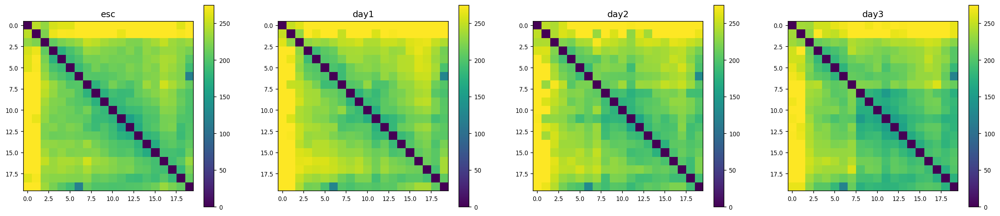

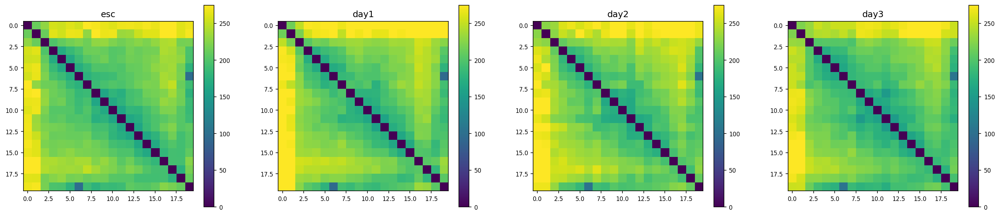

In [4]:
for rep, data in orca.items():
    f, ax = plt.subplots(1, len(data.items()), figsize=(6*len(data.items()), 5))
    for i, (name, track) in enumerate(data.items()):
        im = ax[i].imshow(np.nanmedian(positions_to_distances(track.positions[:, index_imaged]), axis=0), vmin=0, vmax=275)
        plt.colorbar(im, ax=ax[i])
        ax[i].set_title(name)
    plt.show()

# Recreate figure 5g from their paper

Specifically the comparisons for rep1 - rep1_day3 and rep1 - rep1_day2. The order of the distance is reversed making the colorbar the same as in the paper...

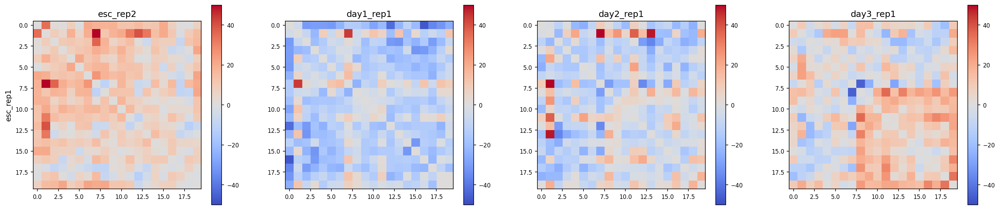

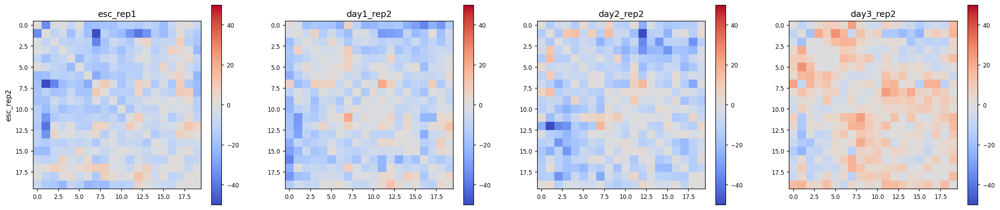

In [5]:
def plot(name1, track1, data):
    f, ax = plt.subplots(1, 4, figsize=(24, 5))
    dists1 = positions_to_average_distance(track1.positions[:, index_imaged])
    ax[0].set_ylabel(name1)
    for j, (name2, track2) in enumerate(data):
        im = ax[j].imshow(dists1 - positions_to_average_distance(track2.positions[:, index_imaged]), cmap='coolwarm', vmin=-50, vmax=50)
        plt.colorbar(im, ax=ax[j])
        ax[j].set_title(name2)

name1, pos1 = 'esc_rep1', orca['rep1']['esc']
data = [('esc_rep2', orca['rep2']['esc'])]
for name in orca['rep1']:
    if name == 'esc':
        continue
    data += [(f'{name}_rep1', orca['rep1'][name])]
plot(name1, pos1, data)

name1, pos1 = 'esc_rep2', orca['rep2']['esc']
data = [('esc_rep1', orca['rep1']['esc'])]
for name in orca['rep2']:
    if name == 'esc':
        continue
    data += [(f'{name}_rep2', orca['rep2'][name])]
plot(name1, pos1, data)

# Noise in reimaging

833.6404802278315 134.9594255091332 98.64262336823916


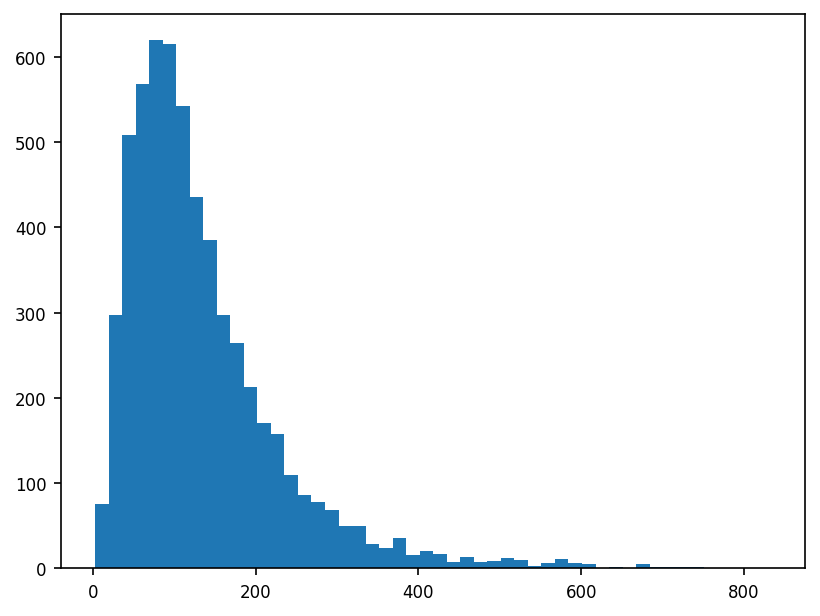

In [6]:
k = 3
reimaged_idx = (6, -1)
orca_positions = np.concatenate([orca['rep1']['esc'].positions[:, index_imaged, :k][:, reimaged_idx],
                                             orca['rep2']['esc'].positions[:, index_imaged, :k][:, reimaged_idx]])

diffs = np.linalg.norm(orca_positions[:, 1] - orca_positions[:, 0], axis=-1)
plt.hist(diffs, bins=50)
print(np.nanmax(diffs), np.nanmean(diffs), np.nanstd(diffs))

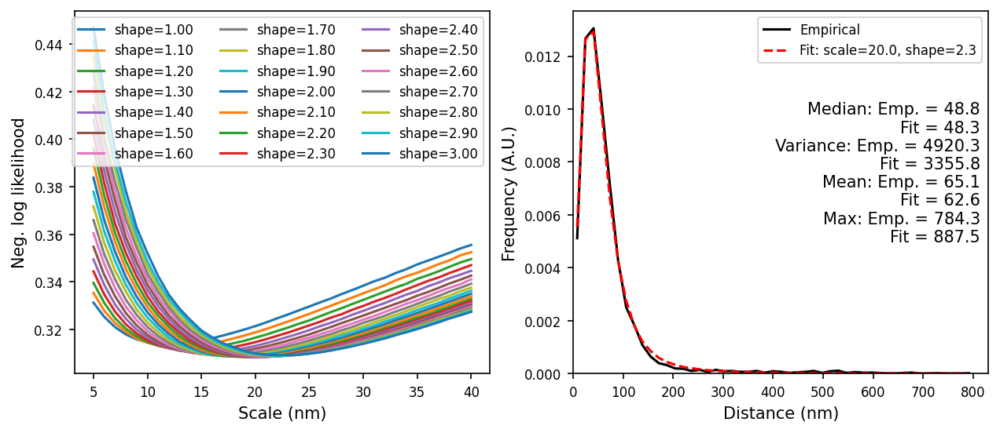

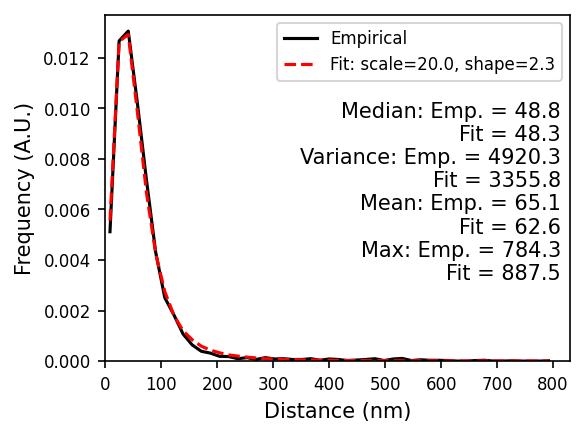

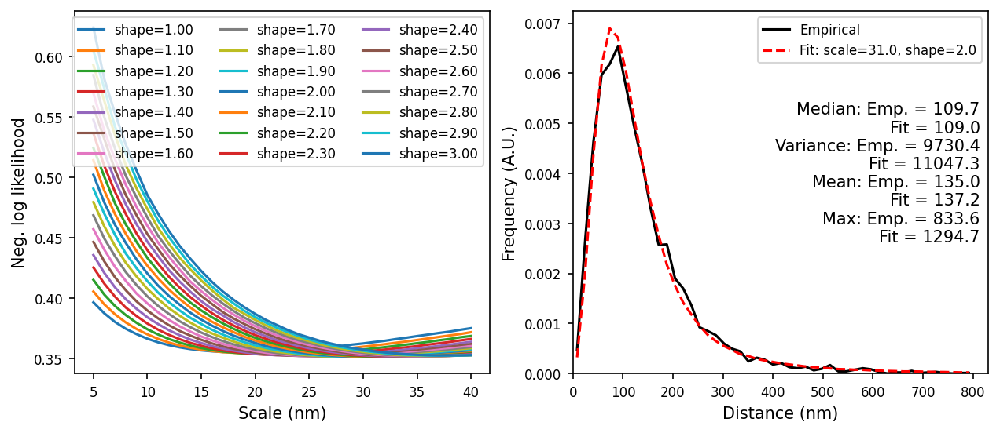

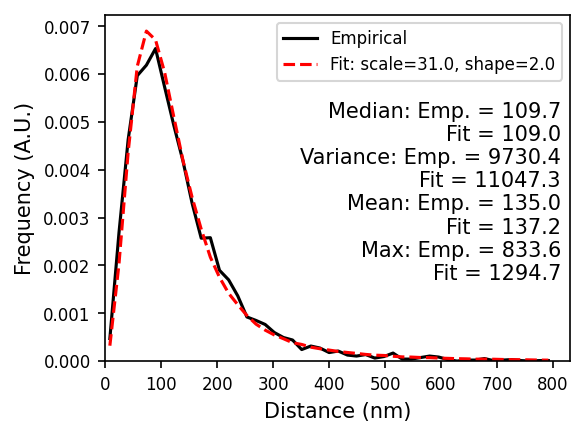

{('merged', 2): NoiseDistribution(dist=t, scale=20.0, shape=2.3, max_val=800),
 ('merged', 3): NoiseDistribution(dist=t, scale=31.0, shape=2.0, max_val=800)}

In [7]:
bins = np.linspace(0, 800, 50)
noise = {}
for k in [2, 3]:
    for rep in ['merged']: #['rep1', 'rep2', 'merged']:
        reimaged_idx = (6, -1)
        if rep == 'merged':
            orca_positions = np.concatenate([orca['rep1']['esc'].positions[:, index_imaged, :k][:, reimaged_idx],
                                             orca['rep2']['esc'].positions[:, index_imaged, :k][:, reimaged_idx]])
        else:
            orca_positions = orca[rep]['esc'].positions[:, index_imaged, :k][:, reimaged_idx]

        noise[(rep, k)] = NoiseDistribution(dist='t', max_val=800)
        noise[(rep, k)].fit_noise(orca_positions, bins, samples=500_000)
        ax = noise[(rep, k)].plot_noise_fit()
        plt.show()

        ax = noise[(rep, k)].plot_best_fit()
        plt.savefig(f'img/orca_noise_fit_k{k}.pdf')
        plt.show()

noise

In [4]:
noise = {('merged', 2): NoiseDistribution(dist='t', scale=20.0, shape=2.3, max_val=800),
         ('merged', 3): NoiseDistribution(dist='t', scale=31.0, shape=2.0, max_val=800)}

# Contact maps

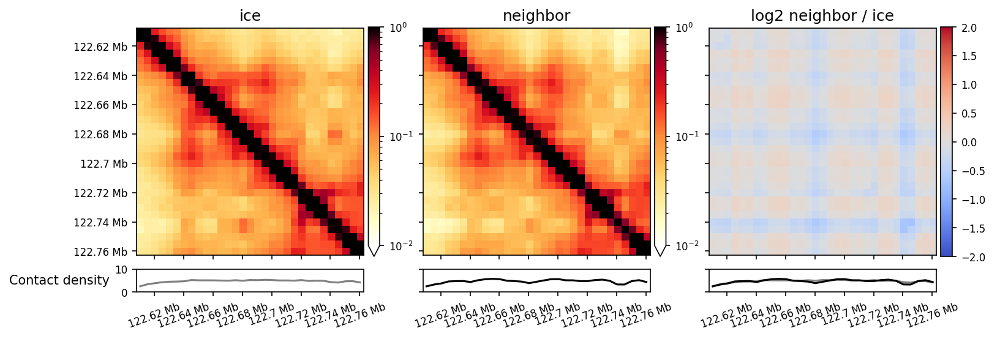

In [5]:
regions = orca['rep1']['esc'].regions[:-1]
# The regions are each 30_001 bp long which creates problems with the coarse-graining...
regions = [(round(s / 100.0) * 100, round(e / 100.0) * 100) for s, e in regions]
ice_contact_map, neighbor_contact_map = load_contact_maps('/home/joepaggi/maxentnuc-private/figures/region_contact_maps/WT_merged/nanog.npz', regions)

neighbor_contact_map.compare(ice_contact_map, 'neighbor', 'ice', density_max=10, vmin=1e-2)
plt.show()

# Simulation paths

In [6]:
supercloud = '/home/joepaggi/share'
conditions = {
    #'sphere 0 kT': {'base': f'{supercloud}/mei_runs/nanog/v39/023', 'scale': 1/10},
    #'sphere 0.8 kT': {'base': f'{supercloud}/mei_runs/nanog/v40/018', 'scale': 1/10},
    'simulation': {'base': f'{supercloud}/mei_runs/nanog/v36/018', 'scale': 1/10},
    'simulation 35 nm': {'base': f'{supercloud}/mei_runs/nanog/v47/015', 'scale': 1/10},
    'simulation 50 nm': {'base': f'{supercloud}/mei_runs/nanog/v46/015', 'scale': 1/10},
    'simulation 1/21': {'base': f'{supercloud}/mei_runs/nanog/v48/019', 'scale': 1/10},
    'simulation 4/21': {'base': f'{supercloud}/mei_runs/nanog/v49/018', 'scale': 1/10},
    #'sphere 1.2 kT': {'base': f'{supercloud}/mei_runs/nanog/v41/018', 'scale': 1/10},
    #'sphere 1.4 kT': {'base': f'{supercloud}/mei_runs/nanog/v43/022', 'scale': 1/10},
}

conditions = expand_conditions(conditions)

# Distance scaling

In [7]:
simulation = load_simulations(orca['rep1']['esc'].regions, conditions, chrom, start, end,  skip=11)

simulation


/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/MDAnalysis/coordinates/DCD.py:165: DeprecationWarning: DCDReader currently makes independent timesteps by copying self.ts while other readers update self.ts inplace. This behavior will be changed in 3.0 to be the same as other readers. Read more at https://github.com/MDAnalysis/mdanalysis/issues/3889 to learn if this change in behavior might affect you.
  warnings.warn("DCDReader currently makes independent timesteps"
/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/MDAnalysis/coordinates/DCD.py:326: DeprecationWarning: asel argument to timeseries will be renamed to'atomgroup' in 3.0, see #3911
  warnings.warn(


simulation 35 nm
simulation 50 nm
simulation 1/21
simulation 4/21


ORCA rep1 234.15554234004313
ORCA rep2 230.1509891228248
35 nm 183.9233444622556
35 nm + noise 198.13746670593682
42 nm 238.72045005931525
42 nm + noise 253.03507488204968
50 nm 347.6195907124907
50 nm + noise 356.1107753966425


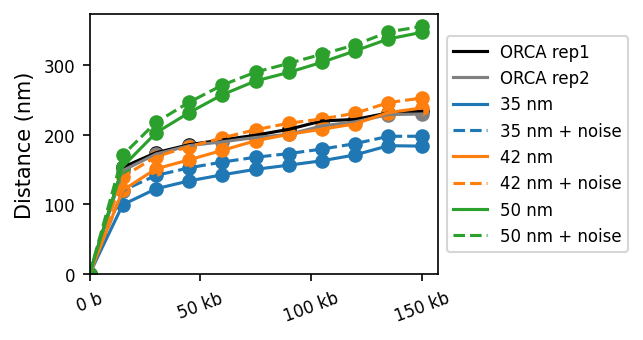

ORCA rep1 261.95923132135295
ORCA rep2 262.53844801515936
35 nm 190.12142555781833
35 nm + noise 231.22830687713136
42 nm 257.39786684239346
42 nm + noise 295.41938803768556
50 nm 364.63248463051696
50 nm + noise 394.054868582493


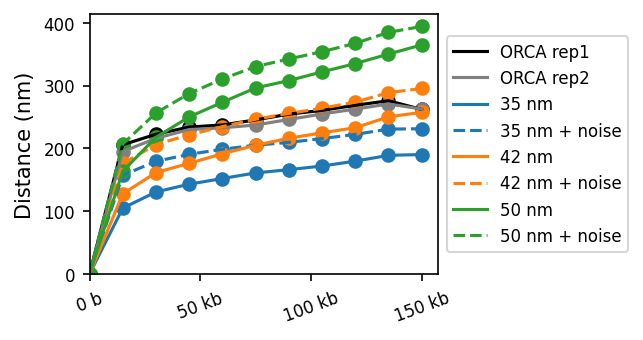

ORCA rep1 187.96298817739728
ORCA rep2 183.26607633779986
35 nm 128.31020535801105
35 nm + noise 148.45659172827152
42 nm 167.66700236234536
42 nm + noise 184.33273331871112
50 nm 247.45291511360506
50 nm + noise 260.84630350181436


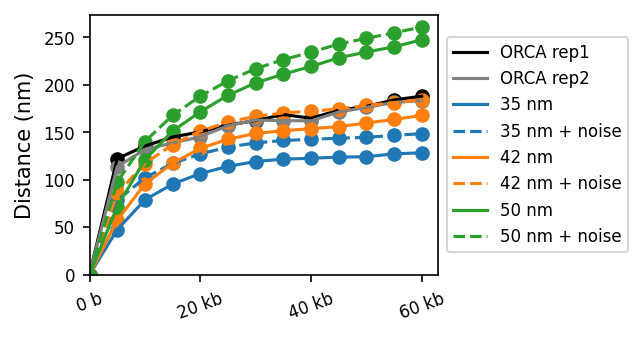

ORCA rep1 224.00466295056532
ORCA rep2 217.09066648939415
35 nm 136.94758447882705
35 nm + noise 187.10318950247085
42 nm 177.50920761923848
42 nm + noise 221.3867005698729
50 nm 256.97042933338537
50 nm + noise 296.2053743716607


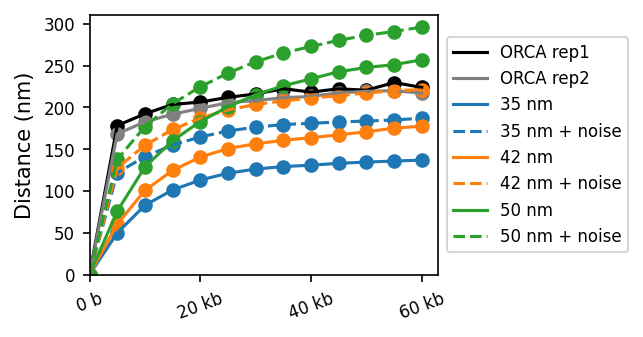

ORCA rep1 234.15554234004313
ORCA rep2 230.1509891228248
1/21 235.19270800484074
1/21 + noise 249.0825122721501
2/21 238.72045005931525
2/21 + noise 253.36192923871158
4/21 241.93822977990718
4/21 + noise 257.06902766313823


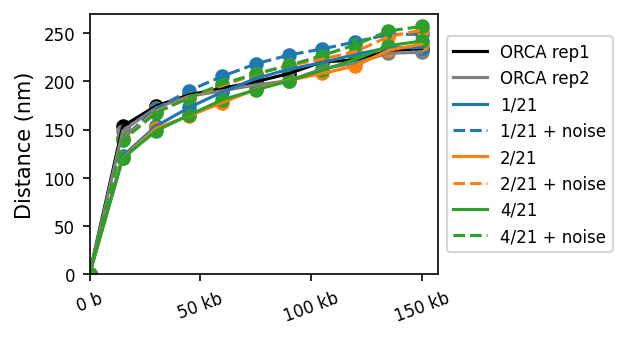

ORCA rep1 261.95923132135295
ORCA rep2 262.53844801515936
1/21 259.35092311132775
1/21 + noise 297.8700346793887
2/21 257.39786684239346
2/21 + noise 294.3684068532322
4/21 249.08863431851626
4/21 + noise 289.466756479749


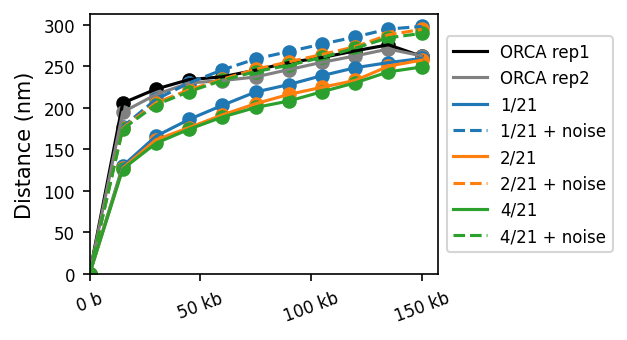

ORCA rep1 187.96298817739728
ORCA rep2 183.26607633779986
1/21 178.82424067192767
1/21 + noise 196.71175418644805
2/21 167.66700236234536
2/21 + noise 184.20305401779524
4/21 160.34515547153796
4/21 + noise 177.6716232909261


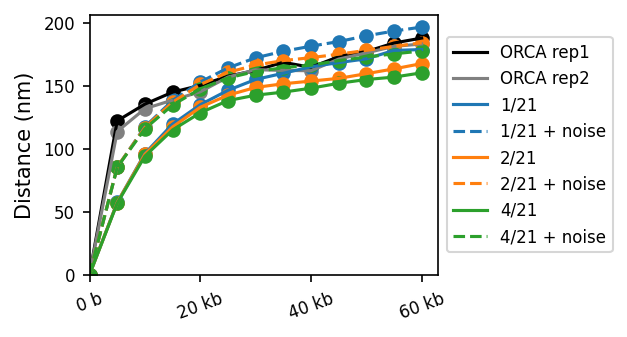

ORCA rep1 224.00466295056532
ORCA rep2 217.09066648939415
1/21 190.17934952502353
1/21 + noise 236.60988652544913
2/21 177.50920761923848
2/21 + noise 221.65854400167433
4/21 167.51453389574937
4/21 + noise 216.27579125557224


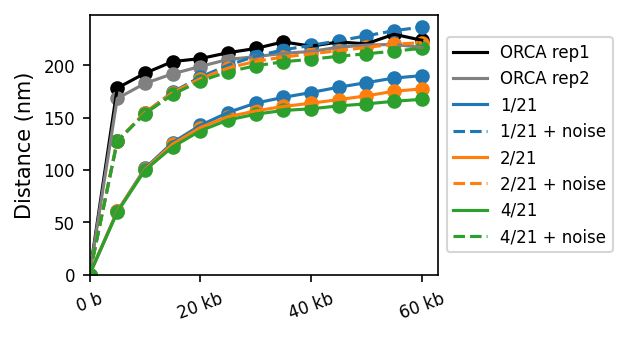

In [10]:
from matplotlib.ticker import ScalarFormatter


def plot_distance_scaling(ax, name, track, c=None, ls=None, distance_scale=1, scatter=True):
    x = track.x()
    x -= x[0]
    dists = distance_scale * get_section_distances(track.positions)
    print(name, dists[-1])

    ax.plot(x, dists, label=name, color=c, ls=ls)
    if scatter:
        ax.scatter(x, dists, color=c)

    ax.set_ylabel('Distance (nm)')
    format_ticks(ax, y=False)
    return ax

def plot_all_distance_scaling(simulation, index, k, legend_in_plot=False):
    def select(track):
        return TrackData(chrom, [r for r, m in zip(track.regions, index) if m], track.positions[:, index, :k])

    distance_scale= 1 if k == 3 else (3/2)**0.5
    f, ax = plt.subplots(figsize=(3, 9/4))

    for rep, color in zip(['rep1', 'rep2'], ['black', 'grey']):
        track = select(orca[rep]['esc']).select_region(start, end)
        plot_distance_scaling(ax, f'ORCA {rep}', track,  c=color, distance_scale=distance_scale)

    colors = plt.get_cmap('tab10').colors
    for (name, track), color in zip(simulation.items(), colors):
        track = select(track).select_region(start, end)

        track_noisy = track.__copy__()
        track_noisy.positions = noise[('merged', k)].add_noise(track_noisy.positions, samples=50)

        plot_distance_scaling(ax, name, track,  c=color, distance_scale=distance_scale)
        plot_distance_scaling(ax, f'{name} + noise', track_noisy, c=color, ls='--',
                              distance_scale=distance_scale)

    if legend_in_plot:
        ax.legend()
    else:
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax.set_ylim(0)
    ax.set_xlim(0)
    return f, ax

def scaling_plots(simulation, fname=None, legend_in_plot=False, plot_path=None):
    for (index_name, index) in [('15kb', index_15kb), ('5kb', index_5kb)]:
        for k in [2, 3]:
            plot_all_distance_scaling(simulation, index, k, legend_in_plot=legend_in_plot)
            if plot_path is not None:
                plt.savefig(plot_path.format(k=k, index_name=index_name))
            plt.show()

_simulation = {'35 nm': simulation['simulation 35 nm'],
               '42 nm': simulation['simulation'],
               '50 nm': simulation['simulation 50 nm'],}
scaling_plots(_simulation, legend_in_plot=False, plot_path='img/orca_nanog_scaling_all_k{k}_{index_name}.pdf')

_simulation = {'1/21': simulation['simulation 1/21'],
               '2/21': simulation['simulation'],
               '4/21': simulation['simulation 4/21'],}
scaling_plots(_simulation, legend_in_plot=False)

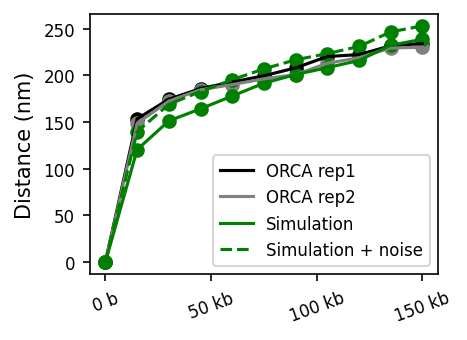

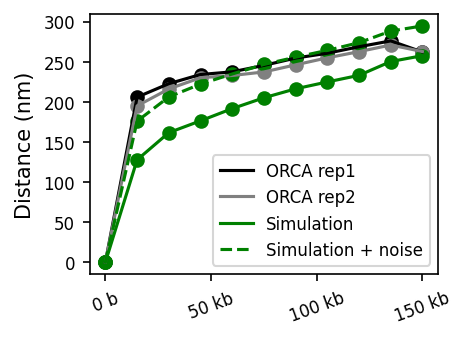

In [10]:
for k in [2, 3]:
    f, ax = plot_all_distance_scaling({'Simulation': simulation['simulation']}, k=k, index=index_15kb, legend_in_plot=True)
    plt.savefig(f'img/orca_nanog_scaling_k{k}.pdf')
    plt.show()

/orcd/home/002/joepaggi/maxentnuc/maxentnuc/analysis/analysis_orca.py:376: RuntimeWarning: invalid value encountered in divide
  plot_pairwise(np.log2(sim_noisy_dists / orca_dists), region, ax=ax[3], vmax=vmax, vmin=vmin, cmap=cmap, log_norm=False)


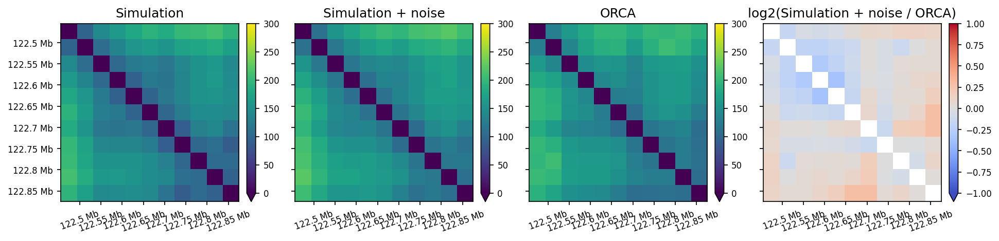

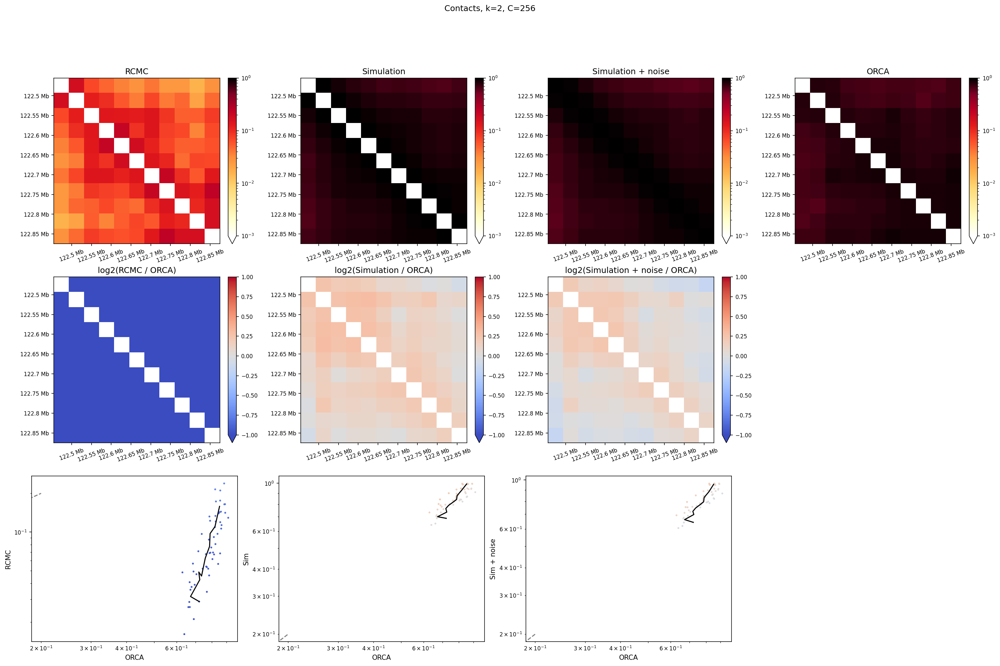

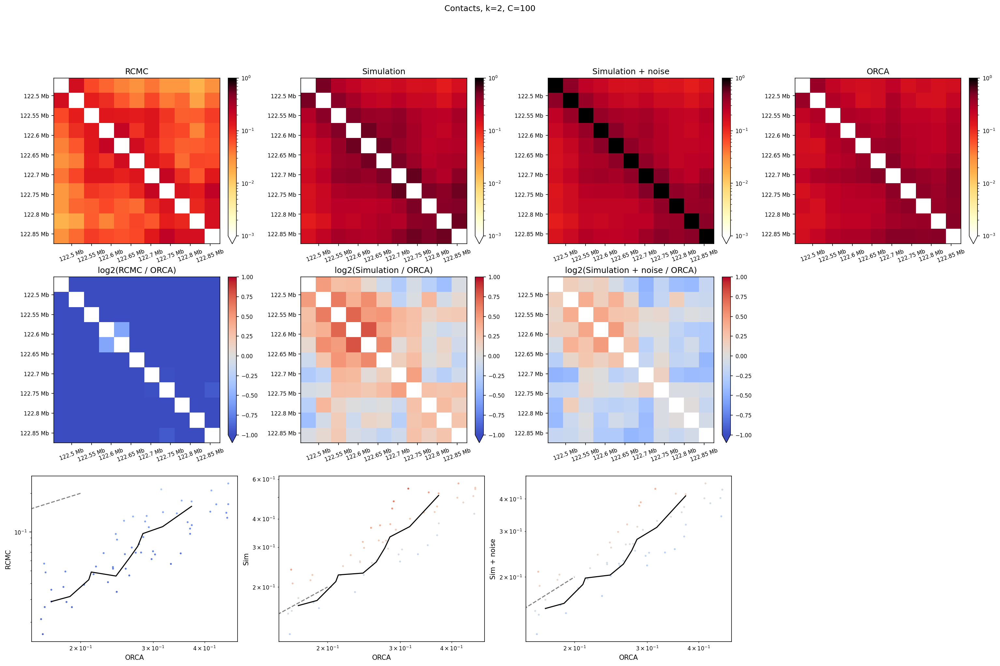

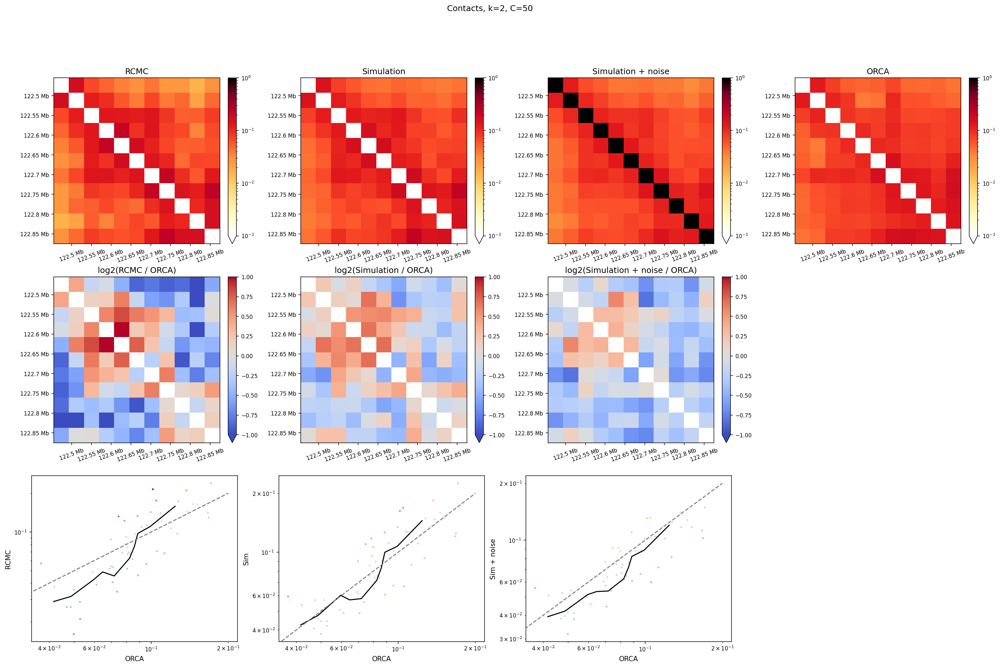

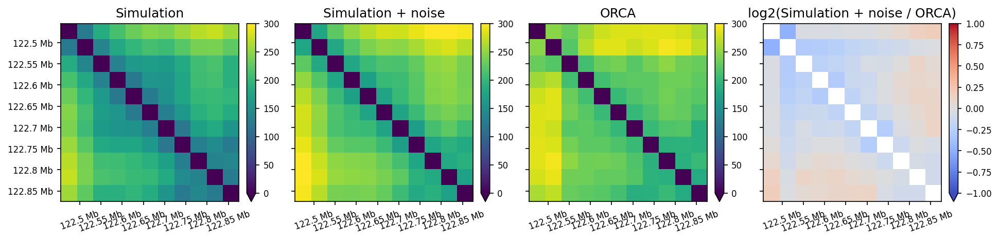

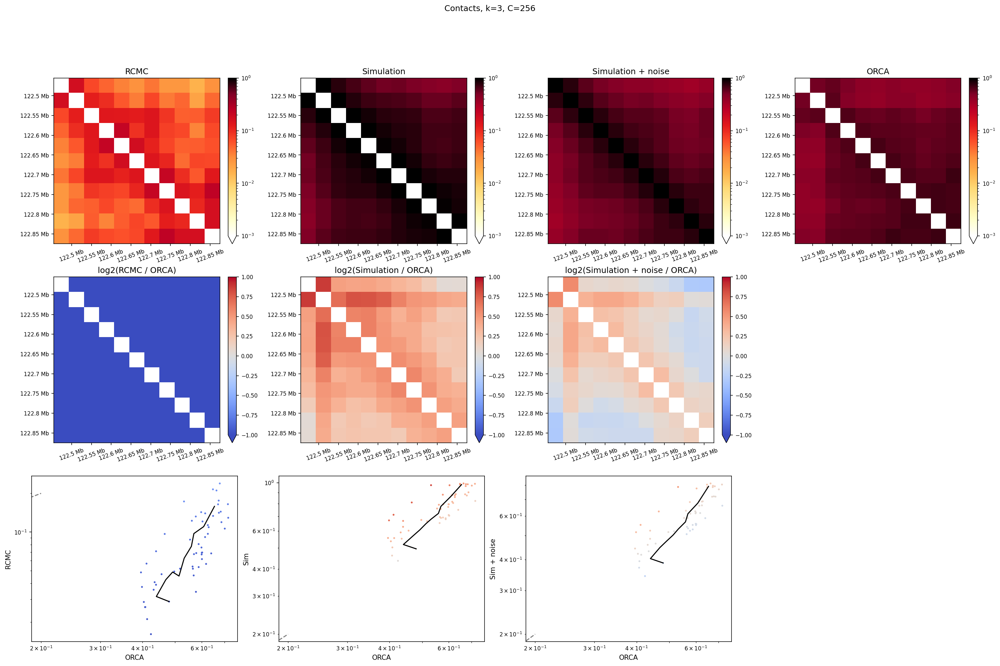

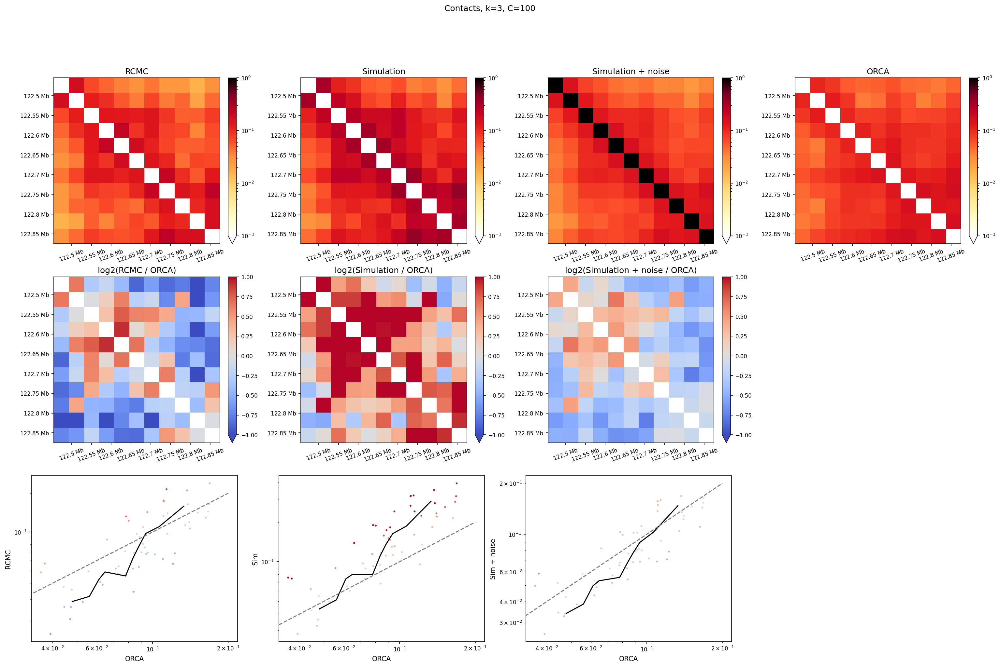

/orcd/home/002/joepaggi/maxentnuc/maxentnuc/analysis/analysis_orca.py:326: RuntimeWarning: divide by zero encountered in divide
  plot_pairwise(np.log2(rcmc_contacts / orca_contacts), region, ax=ax[1, 0], vmax=vmax, vmin=vmin, cmap=cmap, log_norm=False)
/orcd/home/002/joepaggi/maxentnuc/maxentnuc/analysis/analysis_orca.py:328: RuntimeWarning: divide by zero encountered in divide
  plot_pairwise(np.log2(sim_contacts / orca_contacts), region, ax=ax[1, 1], vmax=vmax, vmin=vmin, cmap=cmap, log_norm=False)
/orcd/home/002/joepaggi/maxentnuc/maxentnuc/analysis/analysis_orca.py:330: RuntimeWarning: divide by zero encountered in divide
  plot_pairwise(np.log2(sim_noisy_contacts / orca_contacts), region, ax=ax[1, 2], vmax=vmax, vmin=vmin, cmap=cmap, log_norm=False)
/orcd/home/002/joepaggi/maxentnuc/maxentnuc/analysis/analysis_orca.py:336: RuntimeWarning: divide by zero encountered in divide
  ax.scatter(_x, _y, c=(_y-_x)/_x, cmap=cmap, vmin=vmin, vmax=vmax, s=3)


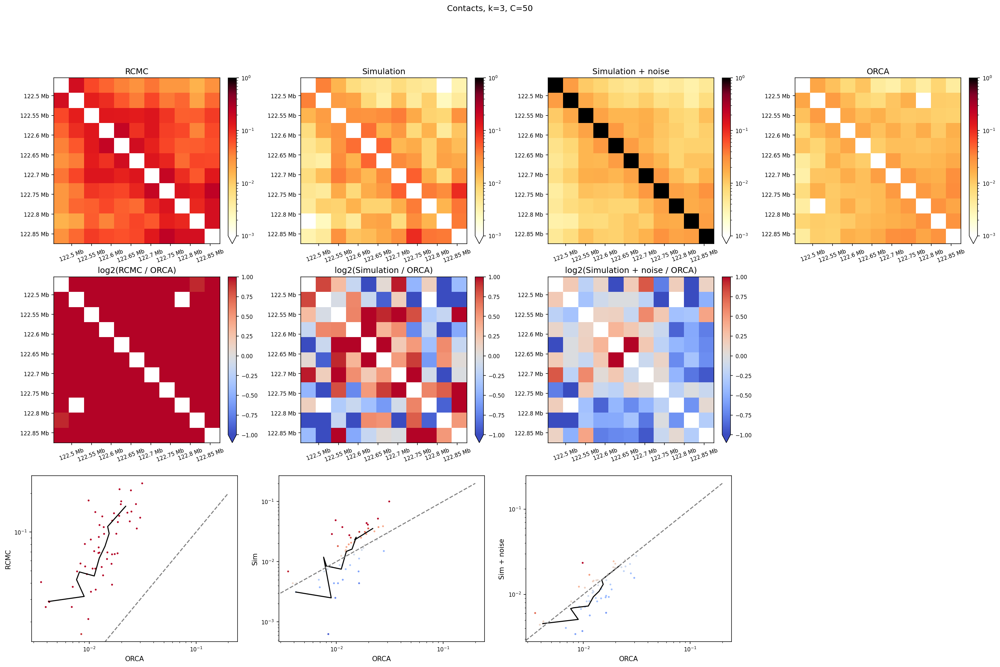

In [14]:
index = index_15kb
region = '{}:{}-{}'.format(chrom, start, end)
sim_condition = 'simulation'


for k in [2, 3]:
    def select(track):
        return TrackData(chrom, [r for r, m in zip(track.regions, index) if m], track.positions[:, index, :k])
    simulation_noisy = simulation[sim_condition].__copy__()
    simulation_noisy.positions = noise[('merged', k)].add_noise(simulation_noisy.positions, samples=50)

    compare_dists(select(orca['rep1']['esc']),
                  select(simulation[sim_condition]),
                  select(simulation_noisy),
                  region, max_dist=300)
    plt.savefig(f'img/nanog_distance_heatmaps_k{k}.pdf')
    plt.show()

    for C in [256, 100, 50]:
        compare_contacts(select(orca['rep1']['esc']), select(simulation[sim_condition]),
                         select(simulation_noisy),
                         neighbor_contact_map.contact_map[index[:-1]][:, index[:-1]], region, C)
        plt.suptitle(f'Contacts, k={k}, C={C}')
        plt.show()

orca rep1 distance (nm) orca rep2 distance (nm)
orca rep1 distance (nm) - log rcmc contacts
orca rep1 distance (nm) - log rcmc neighbor contacts
orca rep1 distance (nm) simulation distance (nm)
orca rep2 distance (nm) - log rcmc contacts
orca rep2 distance (nm) - log rcmc neighbor contacts
orca rep2 distance (nm) simulation distance (nm)
- log rcmc contacts - log rcmc neighbor contacts
- log rcmc contacts simulation distance (nm)
- log rcmc neighbor contacts simulation distance (nm)


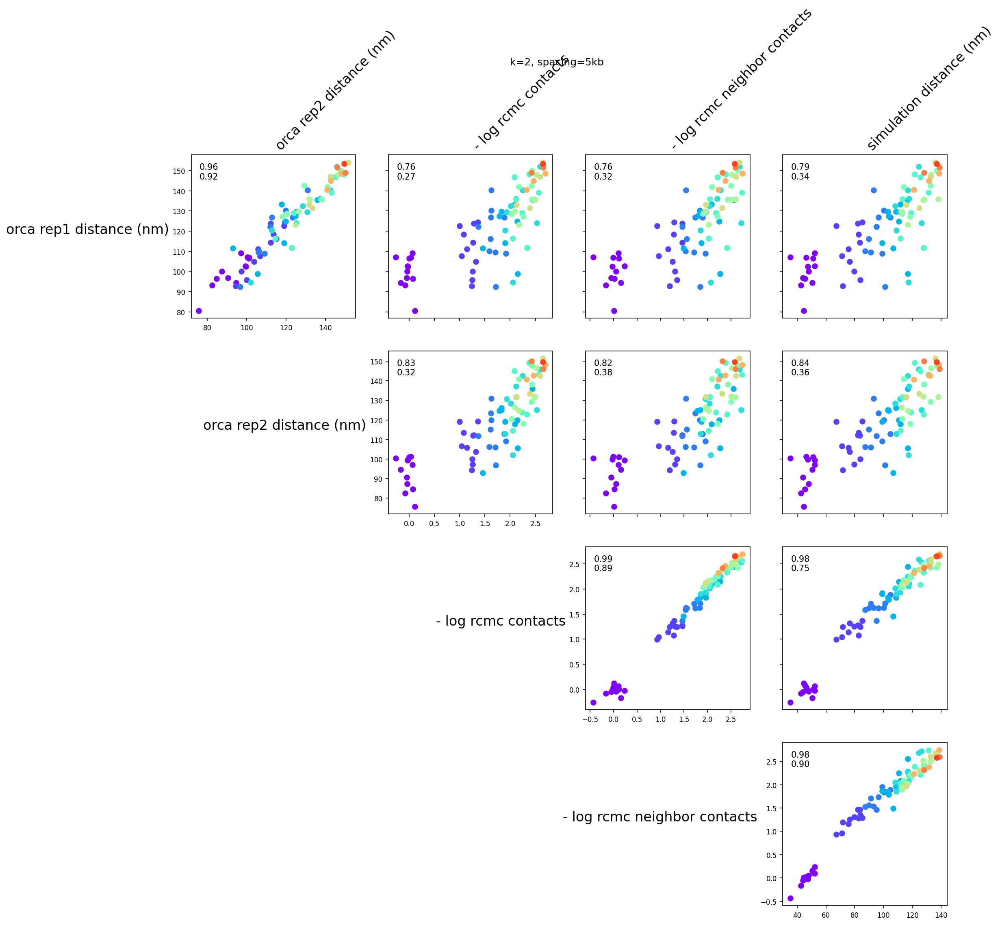

orca rep1 distance (nm) orca rep2 distance (nm)
orca rep1 distance (nm) - log rcmc contacts
orca rep1 distance (nm) - log rcmc neighbor contacts
orca rep1 distance (nm) simulation distance (nm)
orca rep2 distance (nm) - log rcmc contacts
orca rep2 distance (nm) - log rcmc neighbor contacts
orca rep2 distance (nm) simulation distance (nm)
- log rcmc contacts - log rcmc neighbor contacts
- log rcmc contacts simulation distance (nm)
- log rcmc neighbor contacts simulation distance (nm)


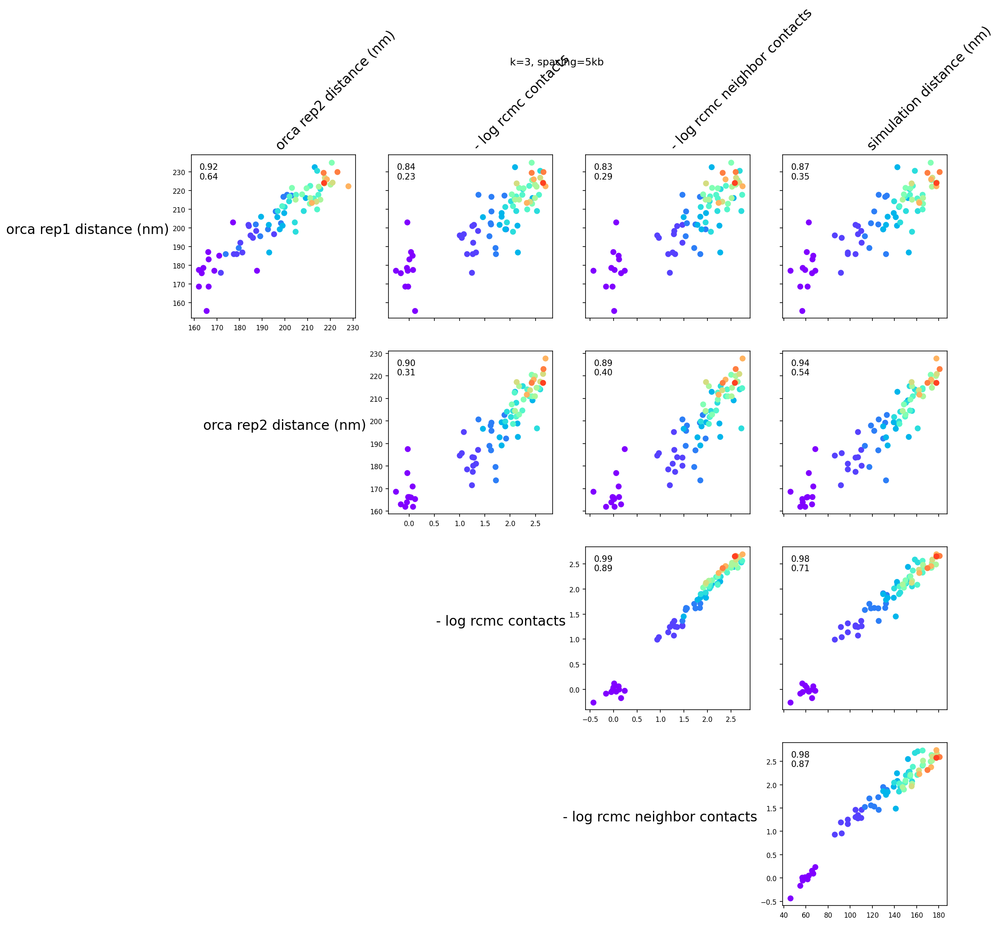

orca rep1 distance (nm) orca rep2 distance (nm)
orca rep1 distance (nm) - log rcmc contacts
orca rep1 distance (nm) - log rcmc neighbor contacts
orca rep1 distance (nm) simulation distance (nm)
orca rep2 distance (nm) - log rcmc contacts
orca rep2 distance (nm) - log rcmc neighbor contacts
orca rep2 distance (nm) simulation distance (nm)
- log rcmc contacts - log rcmc neighbor contacts
- log rcmc contacts simulation distance (nm)
- log rcmc neighbor contacts simulation distance (nm)


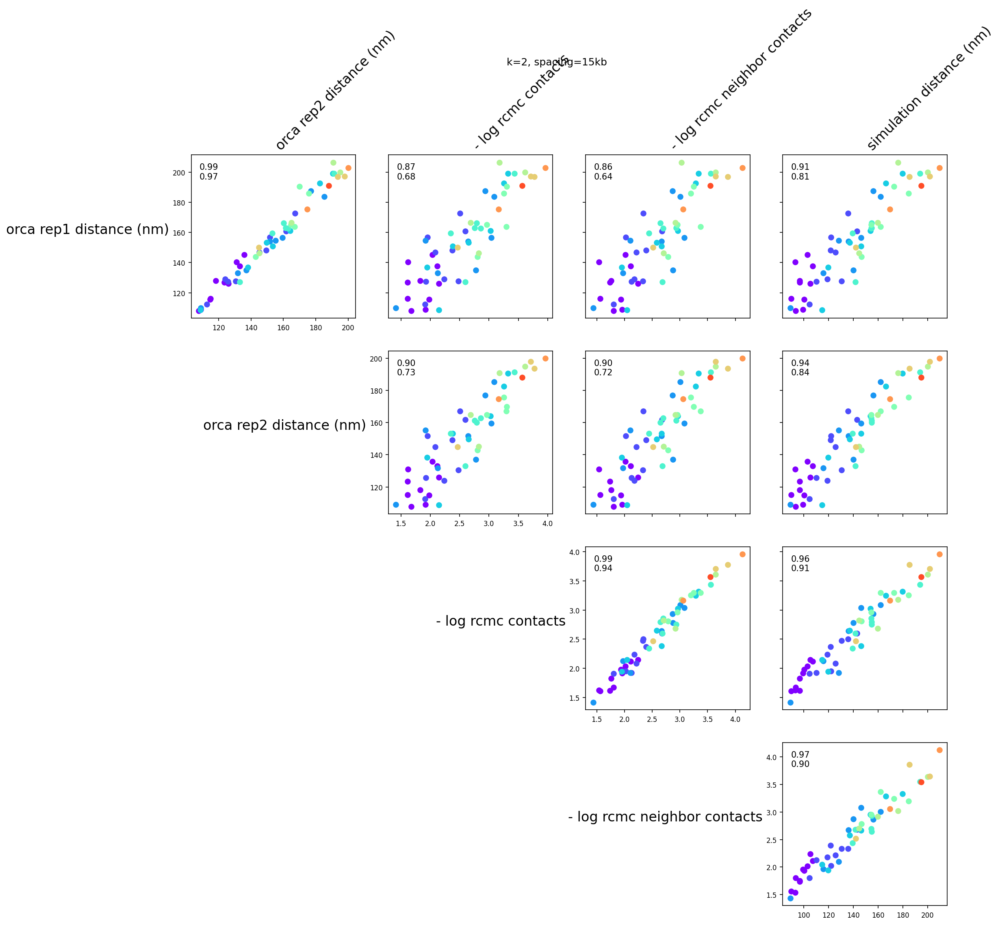

orca rep1 distance (nm) orca rep2 distance (nm)
orca rep1 distance (nm) - log rcmc contacts
orca rep1 distance (nm) - log rcmc neighbor contacts
orca rep1 distance (nm) simulation distance (nm)
orca rep2 distance (nm) - log rcmc contacts
orca rep2 distance (nm) - log rcmc neighbor contacts
orca rep2 distance (nm) simulation distance (nm)
- log rcmc contacts - log rcmc neighbor contacts
- log rcmc contacts simulation distance (nm)
- log rcmc neighbor contacts simulation distance (nm)


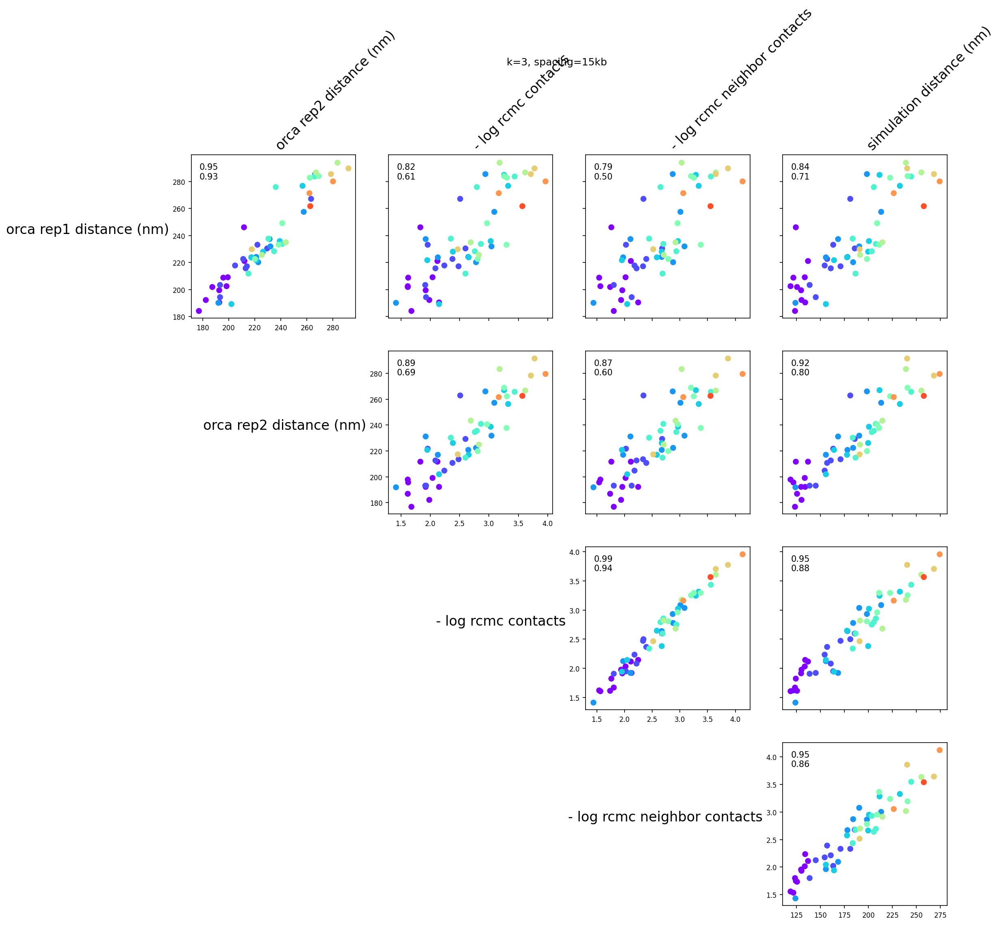

In [15]:
for index_name, index in [('5kb', index_5kb), ('15kb', index_15kb)]:
    for k in [2, 3]:
        def select(track):
            return TrackData(chrom, [r for r, m in zip(track.regions, index) if m], track.positions[:, index, :k])

        measurements = [
            ('orca rep1 distance (nm)', positions_to_average_distance(select(orca['rep1']['esc']).positions)),
            ('orca rep2 distance (nm)', positions_to_average_distance(select(orca['rep2']['esc']).positions)),
            ('- log rcmc contacts', - np.log(ice_contact_map.contact_map[index[:-1]][:, index[:-1]])),
            ('- log rcmc neighbor contacts', - np.log(neighbor_contact_map.contact_map[index[:-1]][:, index[:-1]])),
        ]
        for name in simulation:
            measurements += [
                (f'{name} distance (nm)', positions_to_average_distance(select(simulation[name]).positions))]
        scatter_grid(measurements)
        plt.suptitle(f'k={k}, spacing={index_name}')
        plt.show()

orca rep1 distance (nm) orca rep2 distance (nm)
orca rep1 distance (nm) orca merged distance (nm)
orca rep1 distance (nm) - log rcmc contacts
orca rep1 distance (nm) - log rcmc neighbor contacts
orca rep1 distance (nm) simulation distance (nm)
orca rep1 distance (nm) simulation noise distance (nm)
orca rep2 distance (nm) orca merged distance (nm)
orca rep2 distance (nm) - log rcmc contacts
orca rep2 distance (nm) - log rcmc neighbor contacts
orca rep2 distance (nm) simulation distance (nm)
orca rep2 distance (nm) simulation noise distance (nm)
orca merged distance (nm) - log rcmc contacts
orca merged distance (nm) - log rcmc neighbor contacts
orca merged distance (nm) simulation distance (nm)
orca merged distance (nm) simulation noise distance (nm)
- log rcmc contacts - log rcmc neighbor contacts
- log rcmc contacts simulation distance (nm)
- log rcmc contacts simulation noise distance (nm)
- log rcmc neighbor contacts simulation distance (nm)
- log rcmc neighbor contacts simulation no

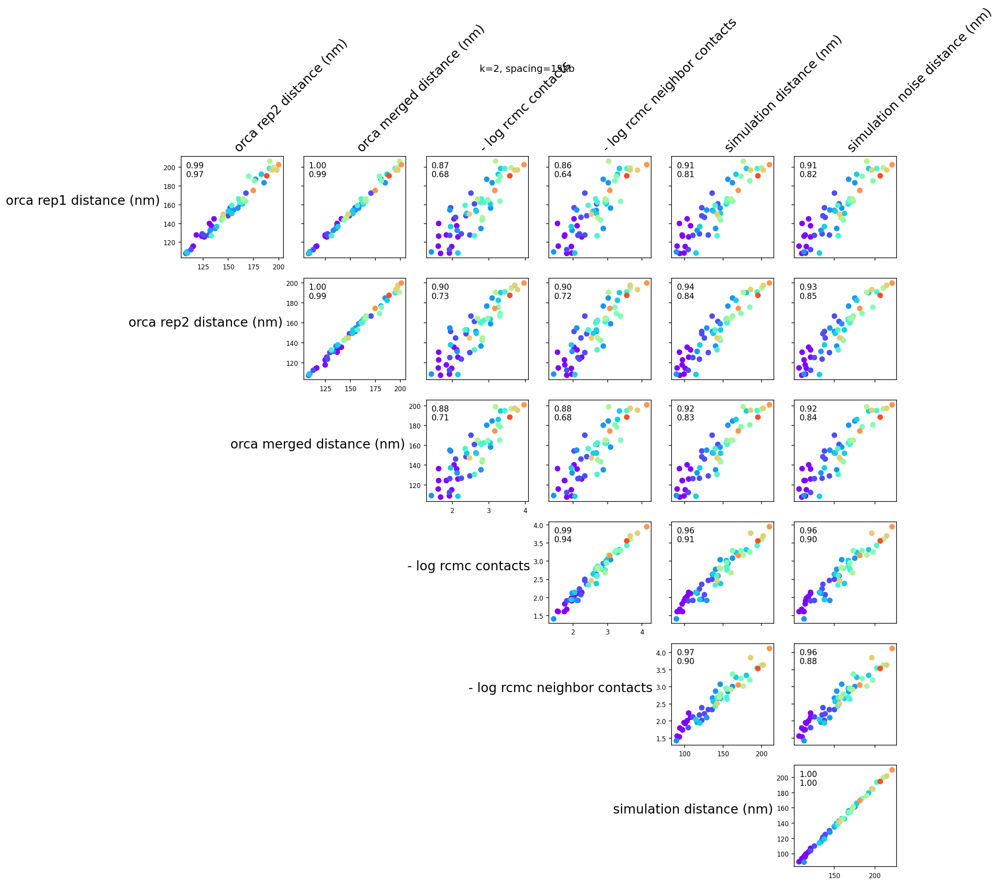

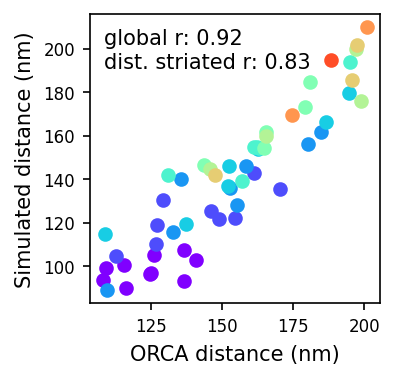

orca rep1 distance (nm) orca rep2 distance (nm)
orca rep1 distance (nm) orca merged distance (nm)
orca rep1 distance (nm) - log rcmc contacts
orca rep1 distance (nm) - log rcmc neighbor contacts
orca rep1 distance (nm) simulation distance (nm)
orca rep1 distance (nm) simulation noise distance (nm)
orca rep2 distance (nm) orca merged distance (nm)
orca rep2 distance (nm) - log rcmc contacts
orca rep2 distance (nm) - log rcmc neighbor contacts
orca rep2 distance (nm) simulation distance (nm)
orca rep2 distance (nm) simulation noise distance (nm)
orca merged distance (nm) - log rcmc contacts
orca merged distance (nm) - log rcmc neighbor contacts
orca merged distance (nm) simulation distance (nm)
orca merged distance (nm) simulation noise distance (nm)
- log rcmc contacts - log rcmc neighbor contacts
- log rcmc contacts simulation distance (nm)
- log rcmc contacts simulation noise distance (nm)
- log rcmc neighbor contacts simulation distance (nm)
- log rcmc neighbor contacts simulation no

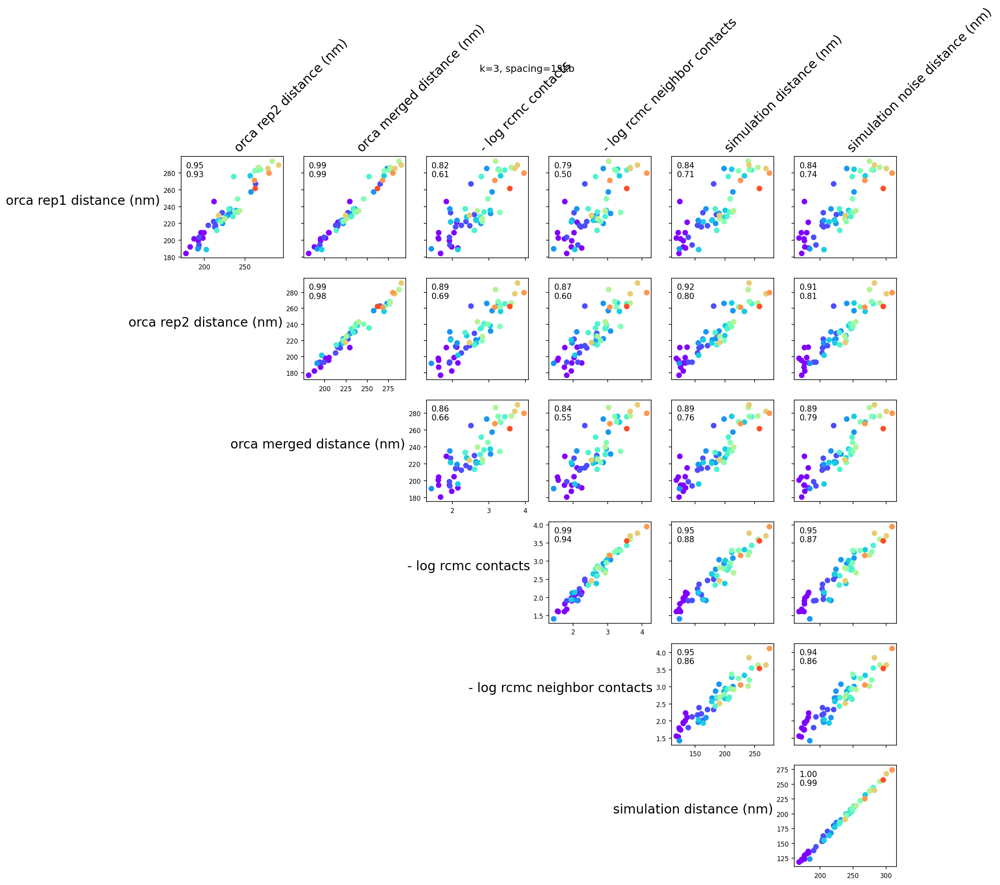

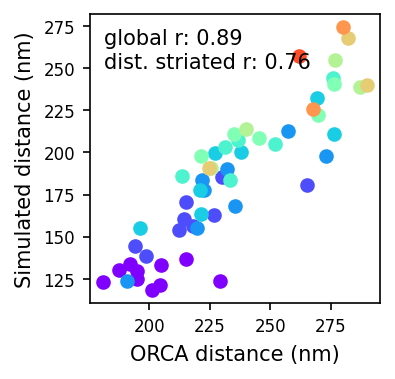

In [16]:
index = index_15kb
for k in [2, 3]:
    def select(track):
        return TrackData(chrom, [r for r, m in zip(track.regions, index) if m], track.positions[:, index, :k])

    merged_orca_positions = np.concatenate([orca['rep1']['esc'].positions, orca['rep2']['esc'].positions], axis=0)[:, index, :k]

    measurements = [
        ('orca rep1 distance (nm)', positions_to_average_distance(select(orca['rep1']['esc']).positions)),
        ('orca rep2 distance (nm)', positions_to_average_distance(select(orca['rep2']['esc']).positions)),
        ('orca merged distance (nm)', positions_to_average_distance(merged_orca_positions)),
        ('- log rcmc contacts', - np.log(ice_contact_map.contact_map[index[:-1]][:, index[:-1]])),
        ('- log rcmc neighbor contacts', - np.log(neighbor_contact_map.contact_map[index[:-1]][:, index[:-1]])),
    ]

    measurements += [
        (f'{name} distance (nm)', positions_to_average_distance(select(simulation['simulation']).positions)),
        (f'{name} noise distance (nm)', positions_to_average_distance(noise[('merged', k)].add_noise(
            select(simulation['simulation']).positions, samples=50)))
    ]
    scatter_grid(measurements)
    plt.suptitle(f'k={k}, spacing={index_name}')
    plt.show()

    f, ax = plt.subplots(figsize=(2.5, 2.5))
    offset_corr, global_corr = compare(positions_to_average_distance(merged_orca_positions),
                                       positions_to_average_distance(select(simulation['simulation']).positions), ax=ax)
    text = f'global r: {global_corr[0]:.2f}\ndist. striated r: {np.mean(offset_corr):.2f}'
    ax.text(0.05, 0.95, text, transform=ax.transAxes, va='top', ha='left')
    #ax.set_aspect('equal')
    ax.set_ylabel('Simulated distance (nm)')
    ax.set_xlabel('ORCA distance (nm)')
    plt.savefig(f'img/orca_scatter_k{k}.pdf')
    plt.show()

0 1 8 2
1 3 8 2
2 5 8 2
3 8 8 2
k=2, spacing=5kb


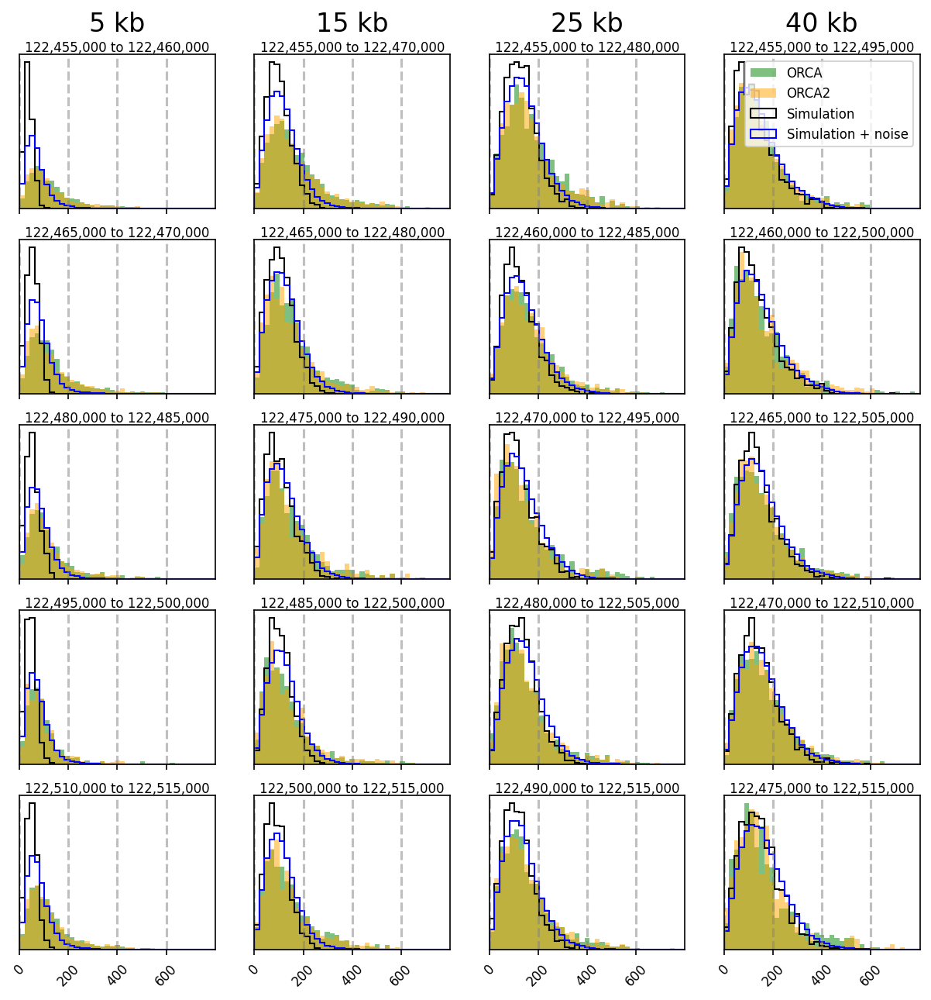

0 1 8 2
1 3 8 2
2 5 8 2
3 8 8 2
k=3, spacing=5kb


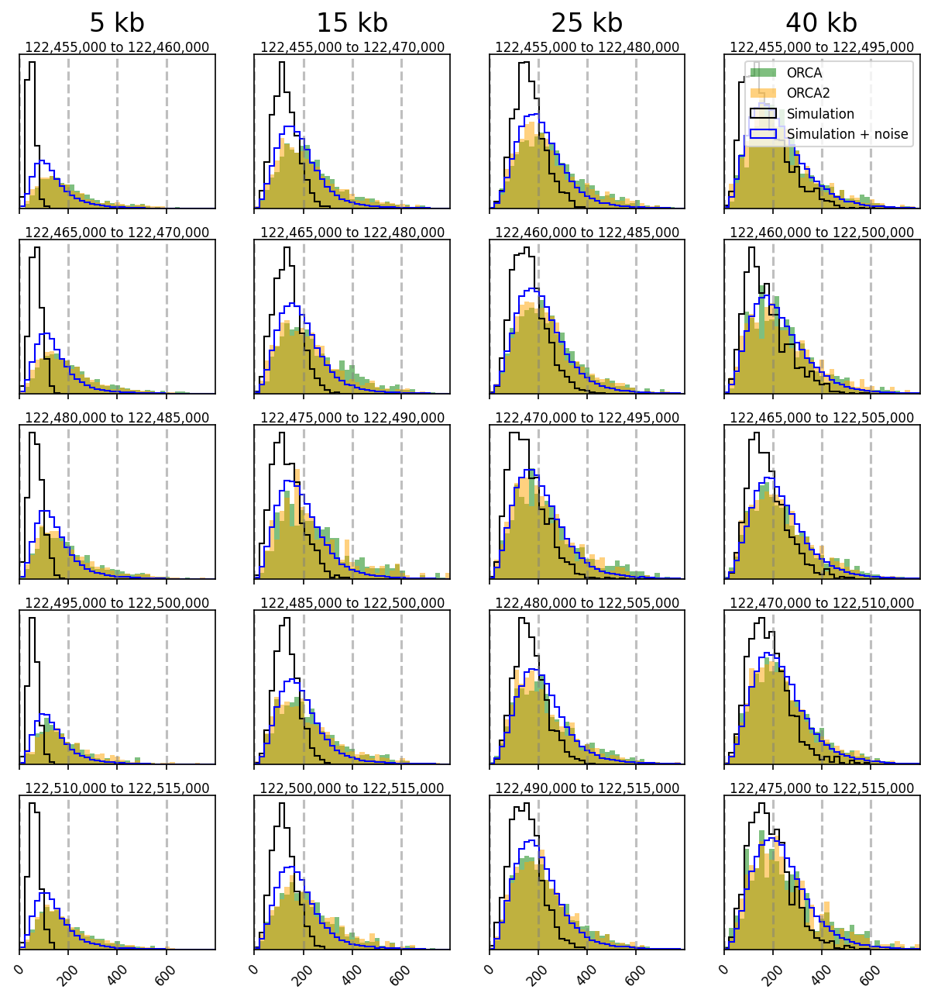

0 1 6 1
1 2 6 1
2 4 6 1
3 6 6 1
k=2, spacing=15kb


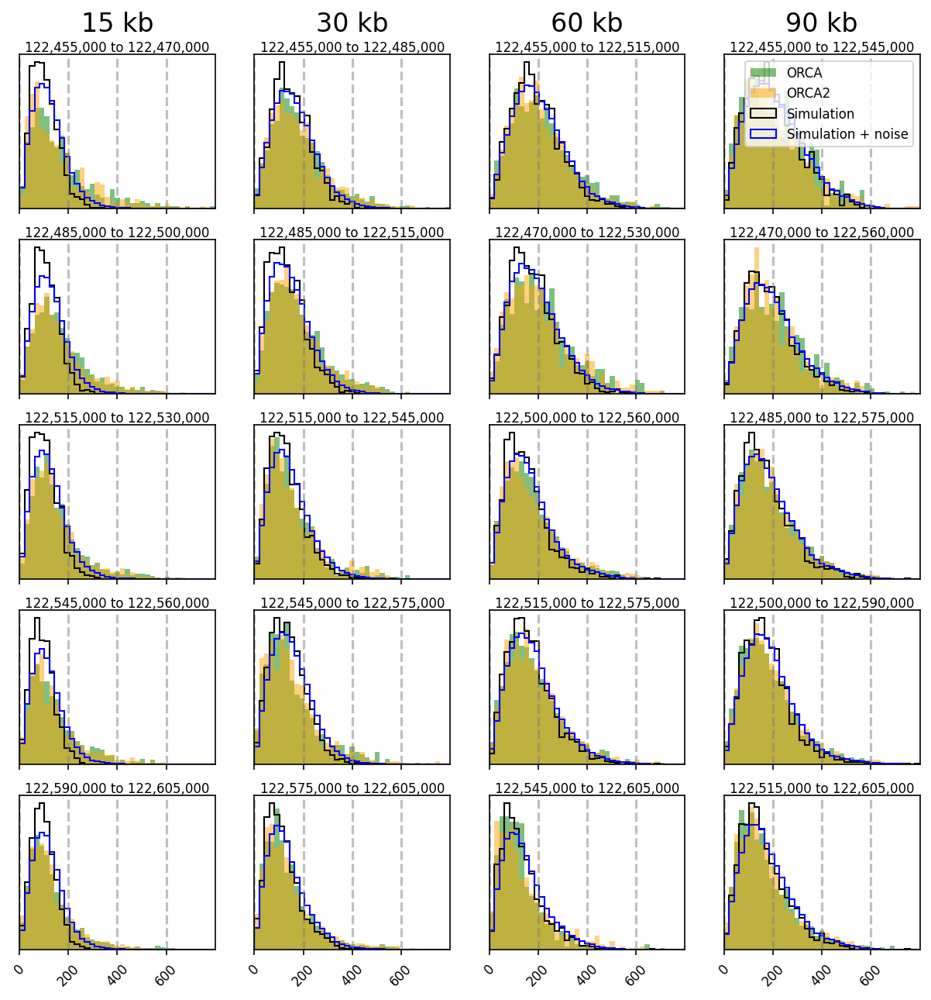

0 1 6 1
1 2 6 1
2 4 6 1
3 6 6 1
k=3, spacing=15kb


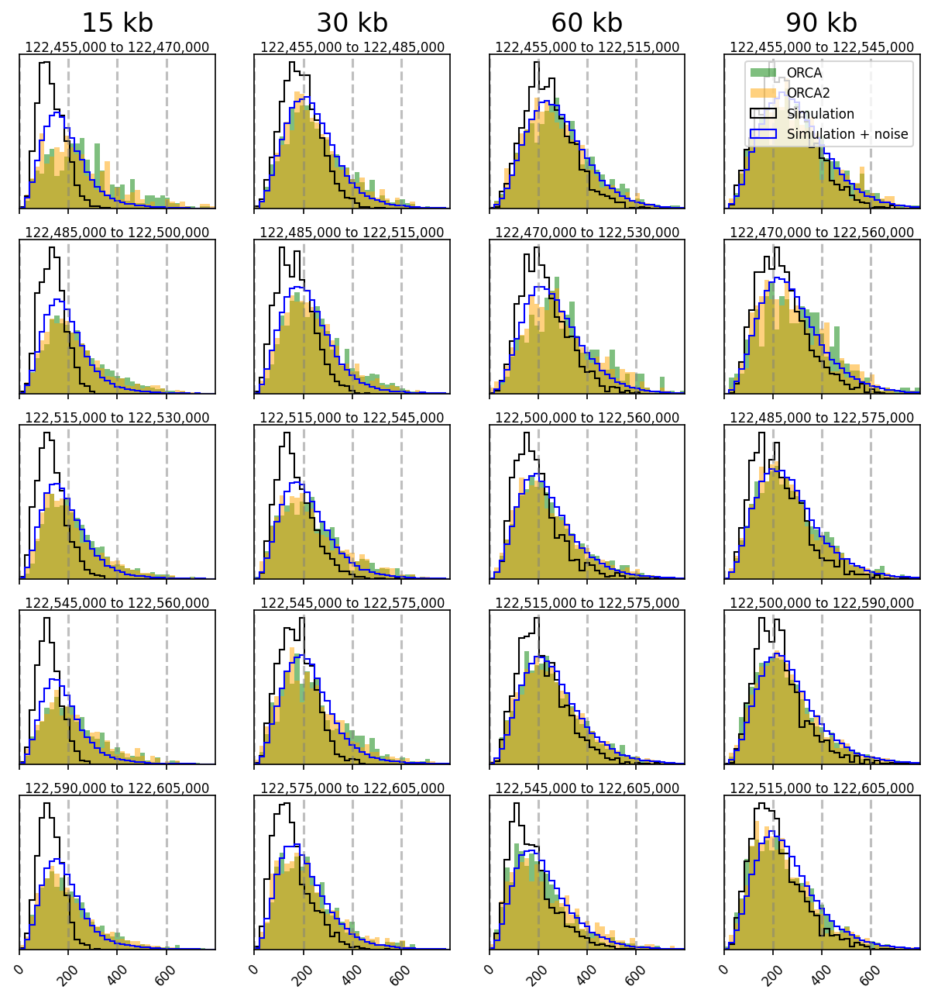

In [17]:

def hist_grid_examples(start, sim, sim_noisy, orca_rep1, orca_rep2=None, high=800, rows=5, cols=4, stride_kb=30):
    bins = np.linspace(0, high, 40)
    f, axs = plt.subplots(rows, cols, figsize=(10, 10), sharex=True)
    for spacing_i, spacing in enumerate(np.linspace(1, sim.shape[1] - rows, cols).astype(int)):
        print(spacing_i, spacing, sim.shape[1] - rows, (sim.shape[1] - rows) // cols)
        ax = axs[0, spacing_i]
        ax.text(0.5, 1.15, f'{spacing * stride_kb} kb', fontsize=16, ha="center", transform=ax.transAxes)

        for example_i, example in enumerate(np.linspace(0, sim.shape[1] - spacing - 1, rows).astype(int)):
            ax = axs[example_i, spacing_i]

            i = example
            j = example + spacing

            ax.set_title(f'{start + i * stride_kb * 1000:,} to {start + j * stride_kb * 1000:,}', size=8, pad=1)

            ax.hist(orca_rep1[:, i, j], bins=bins, density=True, alpha=0.5, color='green', label='ORCA')
            if orca_rep2 is not None:
                ax.hist(orca_rep2[:, i, j], bins=bins, density=True, alpha=0.5, color='orange', label='ORCA2')

            ax.hist(sim[:, i, j], bins=bins, density=True, histtype='step', color='k', label='Simulation')
            ax.hist(sim_noisy[:, i, j], bins=bins, density=True, histtype='step', color='blue',
                    label='Simulation + noise')

            ax.set_yticks([])
            ax.set_xlim(0, high)
            ax.set_xticks(range(0, high, 200))
            for d in range(0, high, 200):
                ax.axvline(d, color='gray', linestyle='--', alpha=0.5)

    axs[0, -1].legend(fontsize=8)

    for ax in axs[-1, :]:
        ax.set_xticklabels(ax.get_xticks(), rotation=45)

rep_sim = 'simulation'

for index_name, index, stride_kb in [('5kb', index_5kb, 5), ('15kb', index_15kb, 15)]:
    for k in [2, 3]:
        def select(track):
            return TrackData(chrom, [r for r, m in zip(track.regions, index) if m], track.positions[:, index, :k])

        sim = positions_to_distances(select(simulation[rep_sim]).positions)
        sim_noisy = positions_to_distances(noise[('merged', k)].add_noise(
            select(simulation[rep_sim]).positions, samples=50))
        orca_rep1 = positions_to_distances(select(orca['rep1']['esc']).positions)
        orca_rep2 = positions_to_distances(select(orca['rep2']['esc']).positions)
        hist_grid_examples(start, sim, sim_noisy, orca_rep1, orca_rep2, stride_kb=stride_kb)
        print(f'k={k}, spacing={index_name}')
        plt.savefig(f'img/nanog_dist_examples_{k}_{index_name}.pdf')
        plt.show()

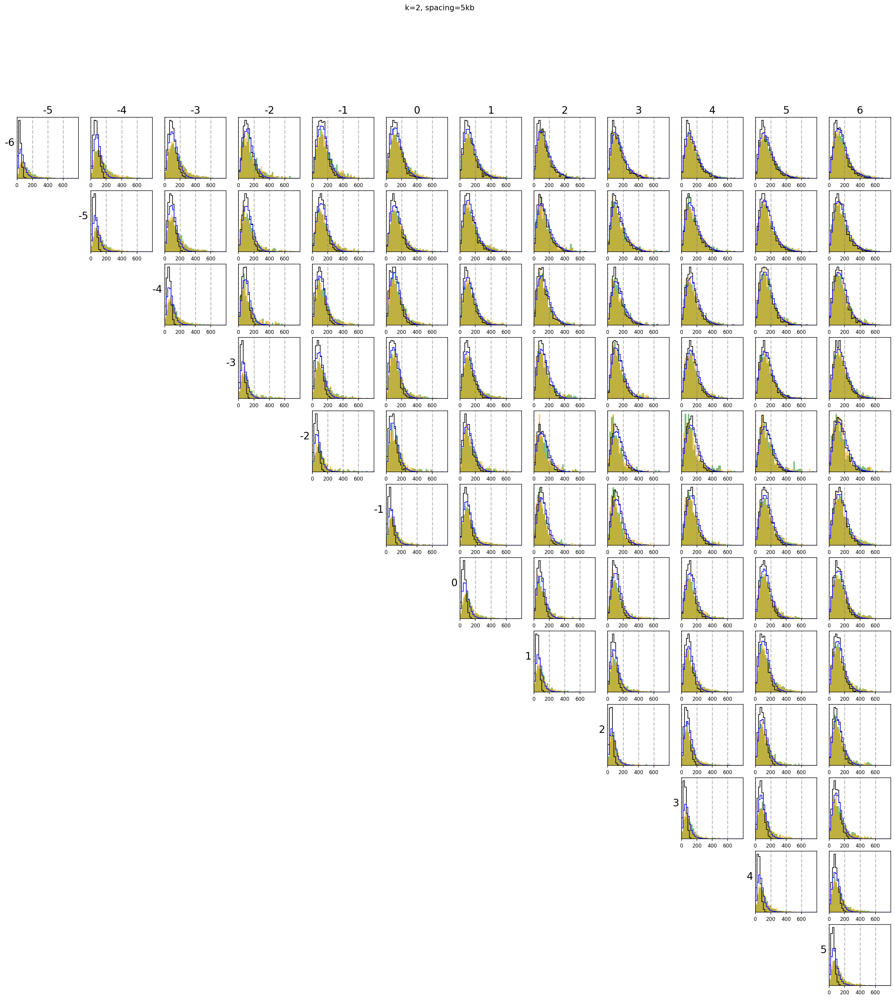

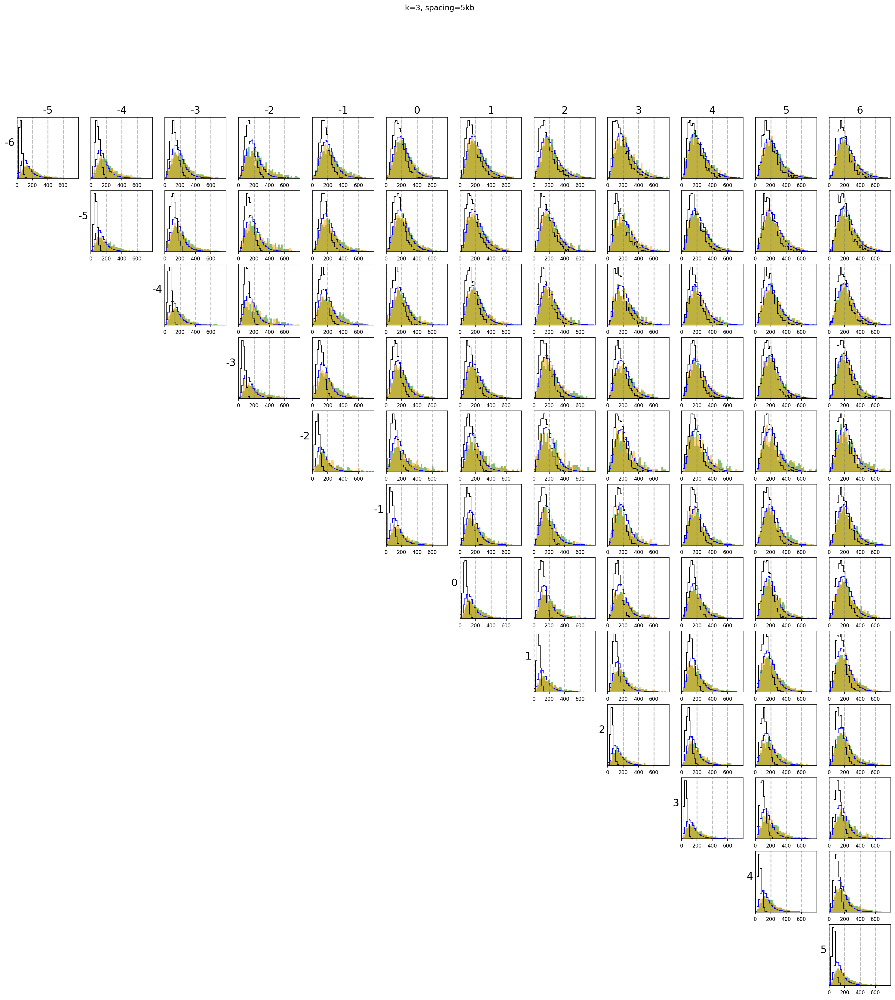

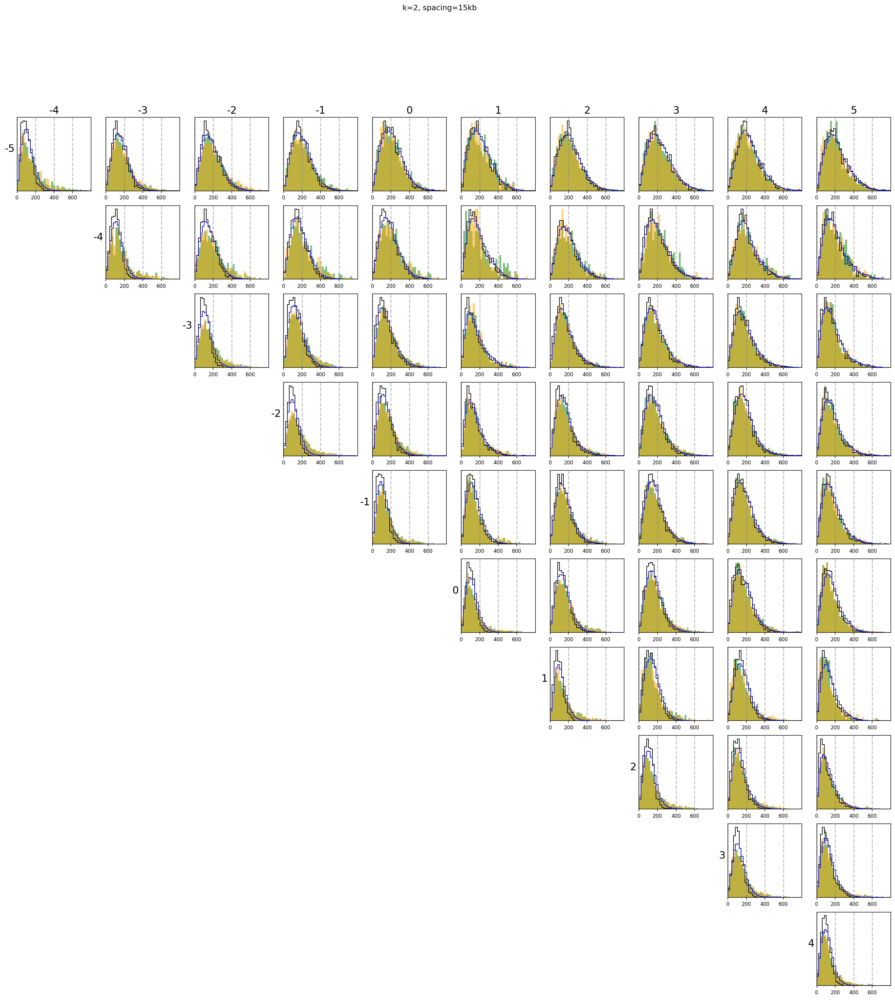

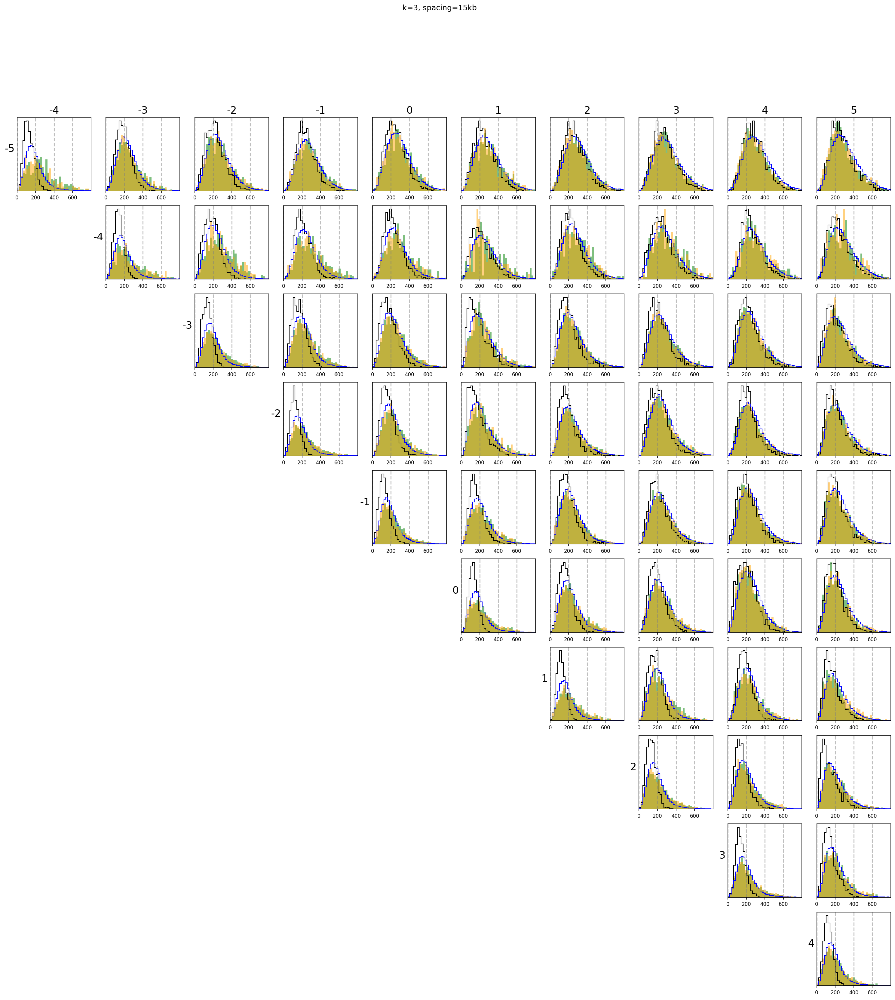

In [18]:
rep_sim = 'simulation'

for index_name, index in [('5kb', index_5kb), ('15kb', index_15kb)]:
    for k in [2, 3]:
        def select(track):
            return TrackData(chrom, [r for r, m in zip(track.regions, index) if m], track.positions[:, index, :k])

        sim = positions_to_distances(select(simulation[rep_sim]).positions)
        sim_noisy = positions_to_distances(noise[('merged', k)].add_noise(
            select(simulation[rep_sim]).positions, samples=50))
        orca_rep1 = positions_to_distances(select(orca['rep1']['esc']).positions)
        orca_rep2 = positions_to_distances(select(orca['rep2']['esc']).positions)
        hist_grid(sim, sim_noisy, orca_rep1, orca_rep2)
        plt.suptitle(f'k={k}, spacing={index_name}')
        plt.savefig(f'img/nanog_dists_{k}_{index_name}.pdf')
        plt.show()

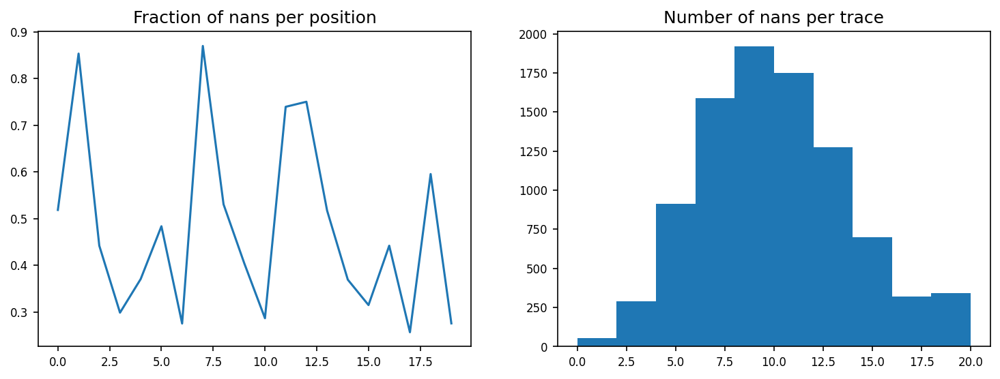

In [19]:
data = np.concatenate([orca['rep1']['esc'].positions, orca['rep2']['esc'].positions], axis=0)

f, ax = plt.subplots(1, 2, figsize=(12, 4))
nans_by_position = np.mean(np.isnan(data[:, index_imaged, 0]), axis=0)
ax[0].plot(nans_by_position)
ax[0].set_title('Fraction of nans per position')

nans = np.sum(np.isnan(data[:, index_imaged, 0]), axis=1)
ax[1].hist(nans)
ax[1].set_title('Number of nans per trace')
plt.show()

/tmp/ipykernel_2503935/3168249683.py:5: RuntimeWarning: Mean of empty slice
  data = data - np.nanmean(data, axis=1, keepdims=True)
/tmp/ipykernel_2503935/3168249683.py:6: RuntimeWarning: Mean of empty slice
  rg = np.sqrt(np.nanmean(np.linalg.norm(data, axis=-1) ** 2, axis=1))


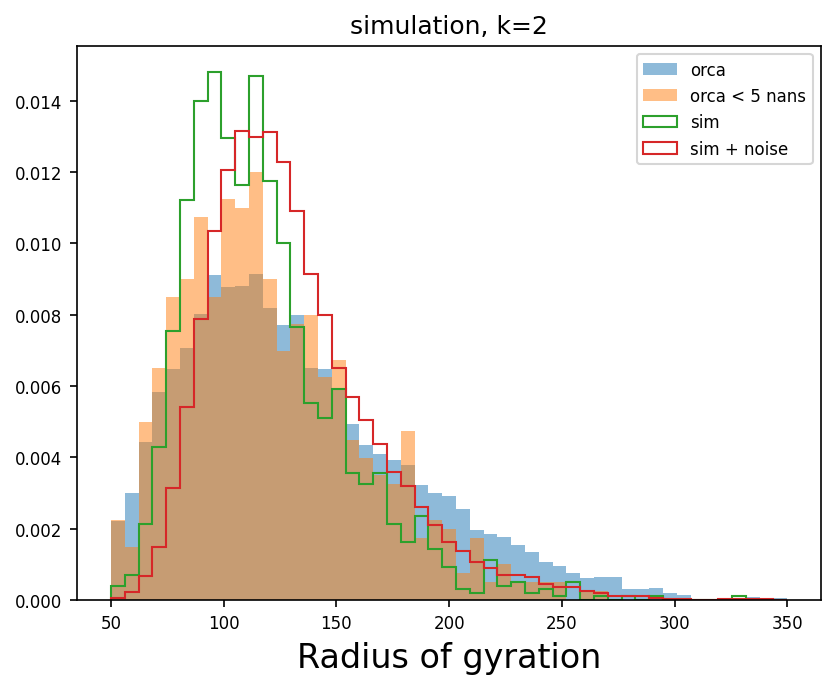

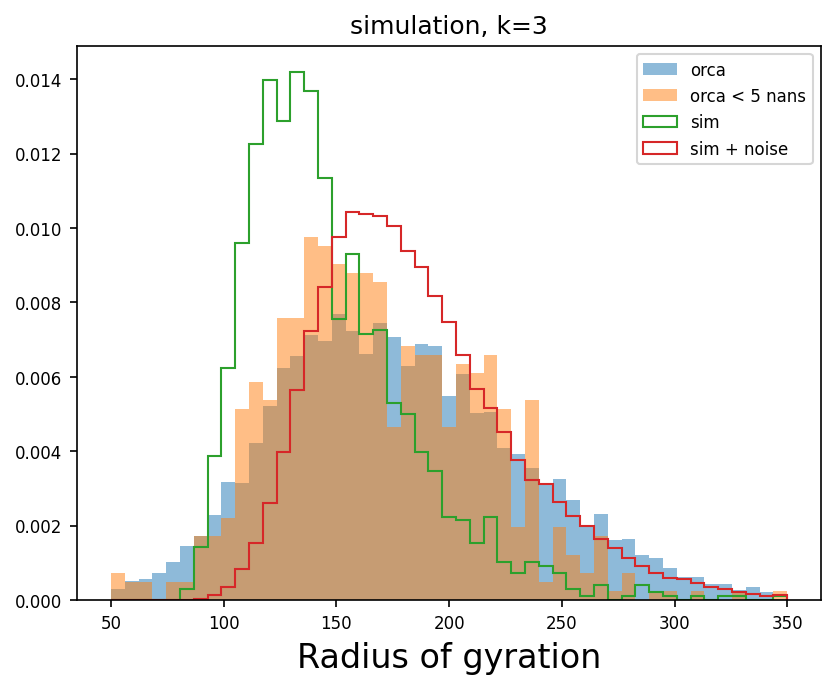

In [20]:
for k in [2, 3]:
    for simulation_condition in simulation:
        def get_rg(data):
            data = data[:, index_15kb, :k]
            data = data - np.nanmean(data, axis=1, keepdims=True)
            rg = np.sqrt(np.nanmean(np.linalg.norm(data, axis=-1) ** 2, axis=1))
            return rg

        bins = np.linspace(50, 350, 50)
        rg = get_rg(data)
        plt.hist(rg, density=True, alpha=0.5, bins=bins, label='orca')

        low = 5
        rg = get_rg(data[nans < low])
        plt.hist(rg, density=True, alpha=0.5, bins=bins, label=f'orca < {low} nans')

        sim = simulation[simulation_condition].positions
        rg = get_rg(sim)
        plt.hist(rg, density=True, histtype='step', bins=bins, label='sim')

        sim = noise[('merged', k)].add_noise(simulation[simulation_condition].positions, samples=50)
        rg = get_rg(sim)
        plt.hist(rg, density=True, histtype='step', bins=bins, label='sim + noise')
        plt.xlabel('Radius of gyration', size=16)
        plt.legend()
        plt.title(f'{simulation_condition}, k={k}')
        plt.show()

# Correlations between distances

In [21]:
k = 2

# experiment = np.concatenate([orca['rep1']['esc'].positions, orca['rep2']['esc'].positions], axis=0)
experiment = orca['rep2']['esc'].positions
experiment = positions_to_distances(experiment[:, index_15kb, :k])

simulation_condition = 'simulation'
sim = simulation[simulation_condition].positions
sim = positions_to_distances(sim[:, index_15kb, :k])

sim_noisy = noise[('merged', k)].add_noise(simulation[simulation_condition].positions, samples=50)
sim_noisy = positions_to_distances(sim_noisy[:, index_15kb, :k])
experiment.shape, sim.shape, sim_noisy.shape

((4228, 11, 11), (1600, 11, 11), (80000, 11, 11))

0 5 10
SignificanceResult(statistic=np.float64(0.22356774178322927), pvalue=np.float64(1.2159046921906372e-09))
SignificanceResult(statistic=np.float64(0.10091075816826492), pvalue=np.float64(5.2636468387663516e-05))
SignificanceResult(statistic=np.float64(0.11706771994222662), pvalue=np.float64(1.9111576904071025e-241))


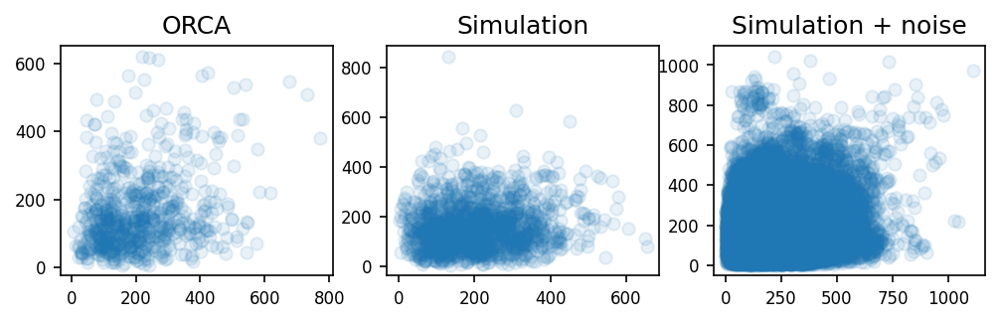

1 5 9
SignificanceResult(statistic=np.float64(0.15361442112955953), pvalue=np.float64(0.0020902367826304193))
SignificanceResult(statistic=np.float64(0.11798922284735269), pvalue=np.float64(2.2185961874144334e-06))
SignificanceResult(statistic=np.float64(0.1357312158585776), pvalue=np.float64(0.0))


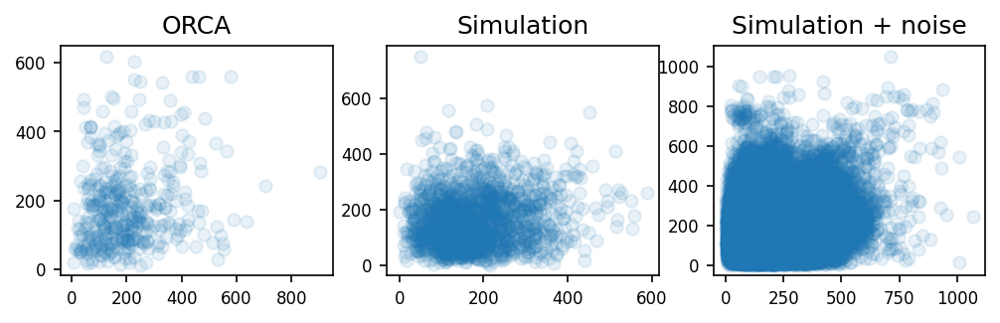

1 9 5
SignificanceResult(statistic=np.float64(0.3145637316813137), pvalue=np.float64(1.2965259851472092e-10))
SignificanceResult(statistic=np.float64(0.26049274433310327), pvalue=np.float64(3.143293957376583e-26))
SignificanceResult(statistic=np.float64(0.2665053065205704), pvalue=np.float64(0.0))


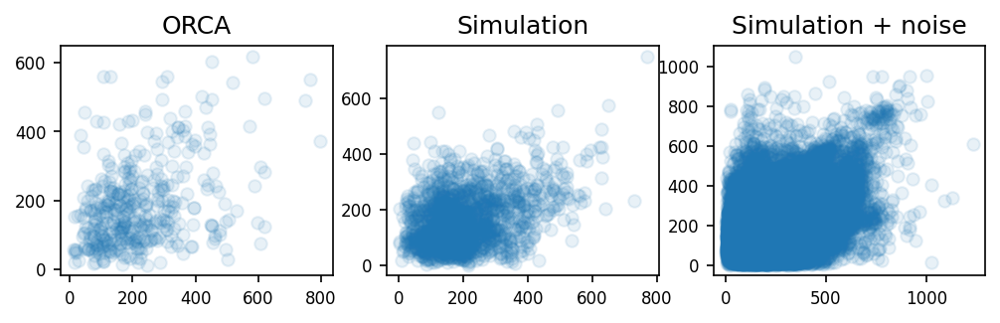

2 4 8
SignificanceResult(statistic=np.float64(0.23488549188027416), pvalue=np.float64(2.4963581309255416e-16))
SignificanceResult(statistic=np.float64(0.10912594497107225), pvalue=np.float64(1.2160149671279496e-05))
SignificanceResult(statistic=np.float64(0.13356705588756848), pvalue=np.float64(0.0))


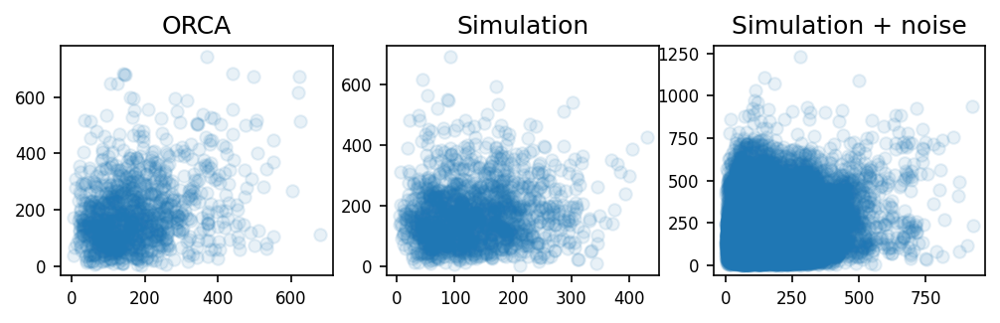

In [22]:
from scipy.stats import pearsonr, spearmanr

r = spearmanr

for (u, v, w) in  [(0, 5, 10), (1, 5, 9), (1, 9, 5), (2, 4, 8)]:
    print(u, v, w)
    f, ax = plt.subplots(1, 3, figsize=(8, 2))
    x, y = experiment[:, u, v], experiment[:, v, w]
    mask = ~np.isnan(x) & ~np.isnan(y)
    print(r(x[mask], y[mask]))
    ax[0].scatter(x, y, alpha=0.1)
    ax[0].set_title('ORCA')

    x, y = sim[:, u, v], sim[:, v, w]
    mask = ~np.isnan(x) & ~np.isnan(y)
    print(r(x[mask], y[mask]))
    ax[1].scatter(x, y, alpha=0.1)
    ax[1].set_title('Simulation')
    
    x, y = sim_noisy[:, u, v], sim_noisy[:, v, w]
    mask = ~np.isnan(x) & ~np.isnan(y)
    print(r(x[mask], y[mask]))
    ax[2].scatter(x, y, alpha=0.1)
    ax[2].set_title('Simulation + noise')
    plt.show()

# Example of distances from promoters

In [23]:
annotations = load_annotations(annotations=f'{data_root}/ucsc/mm39_gene.gtf', alias=f'{data_root}/ucsc/mm39.chromAlias.txt')

genes = ['Apobec1', 'Gdf3', 'Dppa3', 'Nanog']
positions = []
for gene in genes:
    gene = annotations.loc[annotations.gene == gene]
    assert len(gene) == 1
    gene = gene.iloc[0]
    if gene.strand == '+':
        positions.append((gene.start - start) // 200)
    else:
        positions.append((gene.end - start) // 200)

print(' '.join(map(str, positions)))

positions = []
for e in enhancers:
    positions.append((e - start) // 200)
print(' '.join(map(str, positions)))

625 660 741 1147
922 1122 1447


Gene Nanog start: 122684448, closest ORCA position: 122685315.0, diff: 867.0


/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/MDAnalysis/coordinates/DCD.py:165: DeprecationWarning: DCDReader currently makes independent timesteps by copying self.ts while other readers update self.ts inplace. This behavior will be changed in 3.0 to be the same as other readers. Read more at https://github.com/MDAnalysis/mdanalysis/issues/3889 to learn if this change in behavior might affect you.
  warnings.warn("DCDReader currently makes independent timesteps"
/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/MDAnalysis/coordinates/DCD.py:326: DeprecationWarning: asel argument to timeseries will be renamed to'atomgroup' in 3.0, see #3911
  warnings.warn(


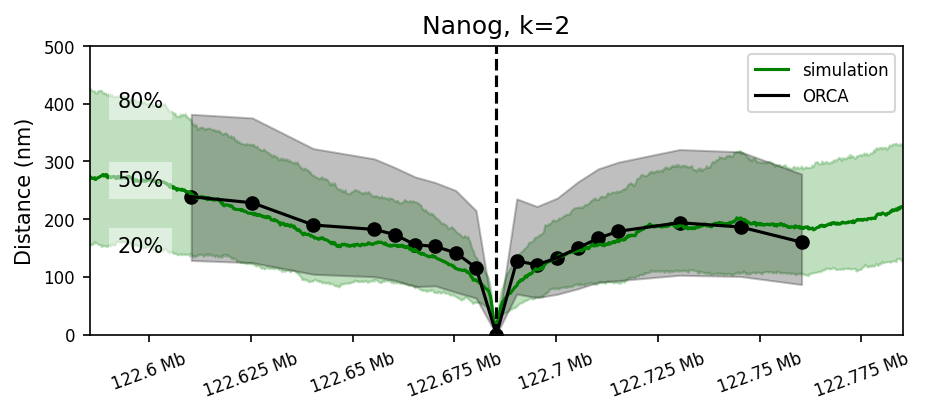

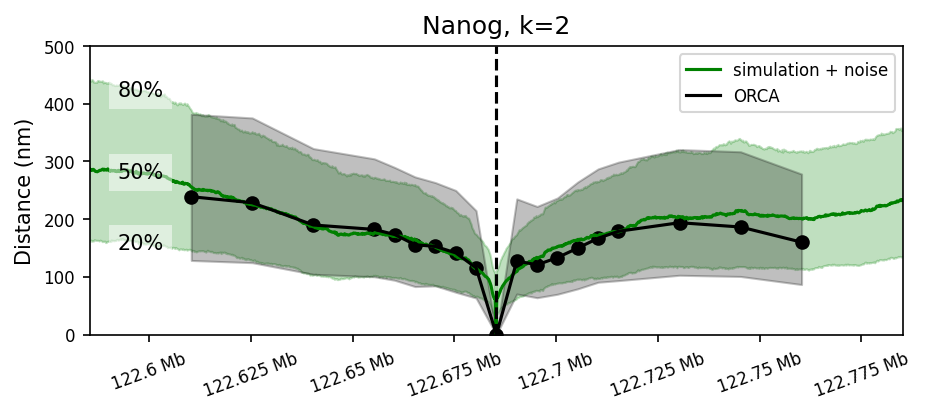

Gene Nanog start: 122684448, closest ORCA position: 122685315.0, diff: 867.0


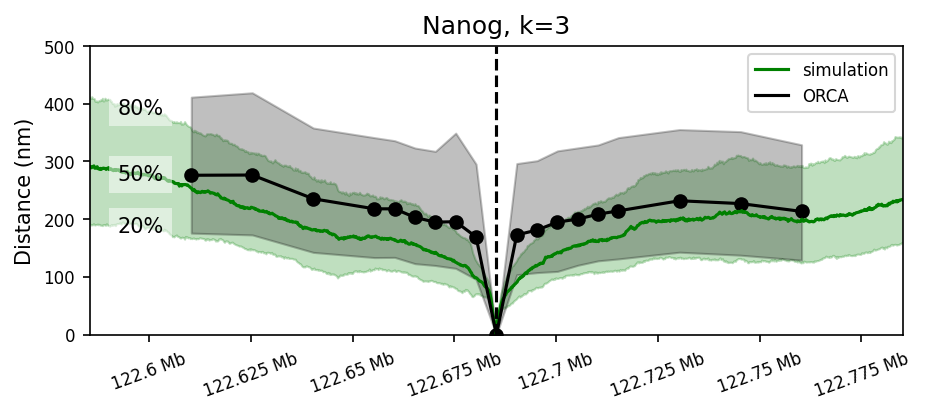

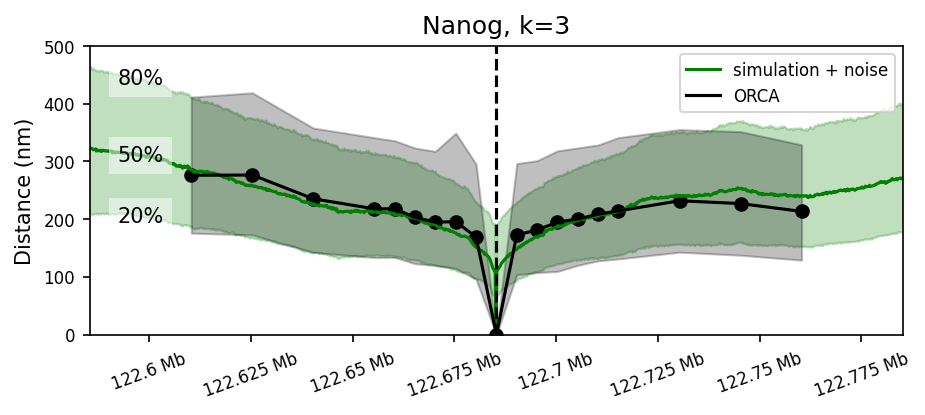

In [24]:
k = 2
low=20
#mid=25
buf = 25_000

def show(ax, x, y, color, label, add_labels=False, label_x=None):
    ax.plot(x, np.nanpercentile(y, 50, axis=0), label=label, c=color)
    #ax.plot(x, np.nanpercentile(y, mid, axis=0), c=color, ls='--')
    #ax.plot(x, np.nanpercentile(y, 100-mid, axis=0), c=color, ls='--')
    ax.fill_between(x,
                    np.nanpercentile(y, low, axis=0),
                    np.nanpercentile(y, 100-low, axis=0),
                    alpha=0.25, color=color)

    if add_labels:
        if label_x is None:
            label_x = x[100]
        for t in [low, 50, 100-low]:
            v = np.nanpercentile(y, t, axis=0)[np.argmin(np.abs(label_x-x))]
            ax.text(label_x, v, f'{t}%', color='black', size=10, ha='center', va='center',
                    bbox={'facecolor': 'white', 'edgecolor': 'none', 'alpha': 0.5})

for k in [2, 3]:
    for gene in ['Nanog']:
        gene_start = annotations[annotations.gene == gene].start.values[0]
        
        x = orca['rep1']['esc'].x()
        closest = np.argmin(np.abs(x - gene_start))
        diff = x[closest] - gene_start
        print(f'Gene {gene} start: {gene_start}, closest ORCA position: {x[closest]}, diff: {diff}')
        gene_start += int(diff)  # align the gene start with the ORCA coordinates

        name = 'simulation'
        info = conditions[name]
        positions = load_polymer(info['psf'], info['dcd'], info['selection'], info['scale'], skip=11, burnin=0.0)
        positions = np.array(positions)[:, :, :k]
        index_promoter = (gene_start - start) // 200

        for noisy in [False, True]:
            f, ax = plt.subplots(figsize=(7, 2.5))

            if noisy:
                _positions = noise[('merged', k)].add_noise(positions, samples=10)
            else:
                _positions = positions

            distances = np.linalg.norm(_positions - _positions[:, index_promoter:index_promoter+1], axis=-1)

            orca_coords = orca['rep1']['esc'].x()[index_15kb | index_5kb]
            i = np.argmin(np.abs(orca_coords - gene_start))
            orca_positions = np.concatenate([orca['rep1']['esc'].positions, orca['rep2']['esc'].positions], axis=0)[:, index_15kb | index_5kb, :k]
            orca_distances_from_nanog = positions_to_distances(orca_positions)[:, i]
            
            distance_scale= 1 if k == 3 else (3/2)**0.5
            distances *= distance_scale
            orca_distances_from_nanog *= distance_scale

            label = f'{name} + noise' if noisy else name
            show(ax, range(start, end, 200), distances, 'green', label, add_labels=True, label_x=orca_coords[0] - buf/2)
            ax.scatter(orca_coords, np.nanmedian(orca_distances_from_nanog, axis=0), color='black')
            show(ax, orca_coords, orca_distances_from_nanog, 'black', 'ORCA')

            # for enhancer in enhancers:
            #     ax.axvline(enhancer, color='magenta', linestyle='--')
            ax.set_title(f'{gene}, k={k}')
            ax.axvline(gene_start, color='black', linestyle='--')
            ax.set_xlim(start, end)
            format_ticks(ax, y=False)
            ax.set_ylim(0, 500)
            ax.set_xlim(orca_coords[0] - buf, orca_coords[-1] + buf)
            ax.set_ylabel('Distance (nm)')
            ax.legend(loc='upper right')
            plt.savefig(f'img/orca_nanog_{gene}_k{k}_noise{int(noisy)}.pdf')
            plt.show()

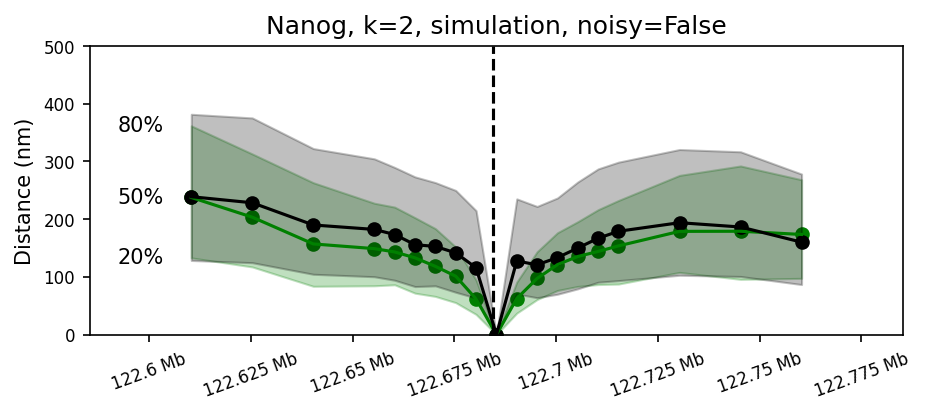

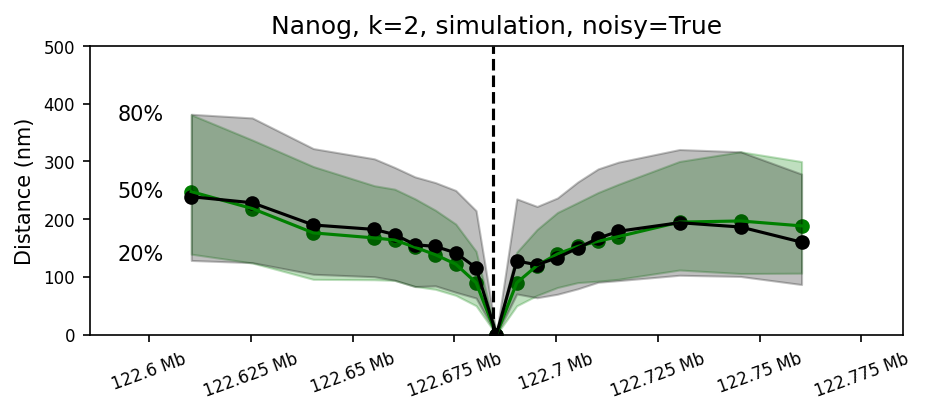

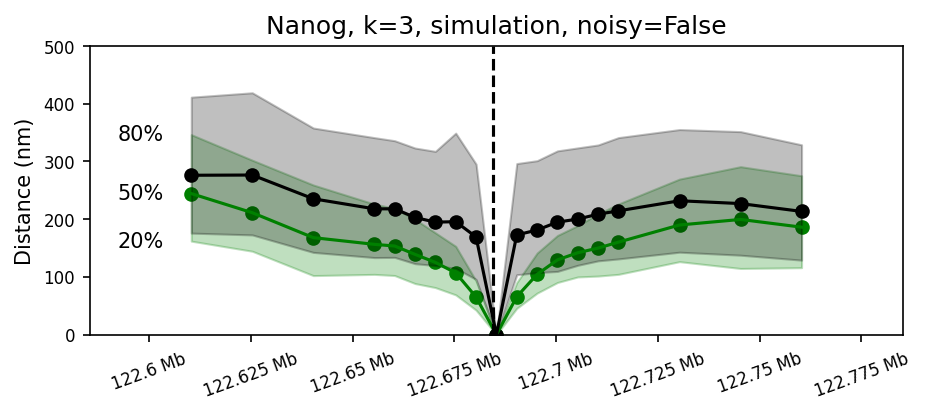

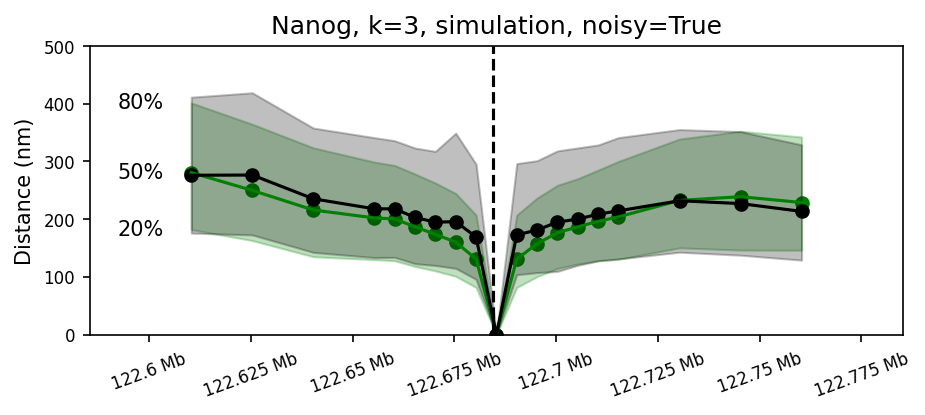

In [25]:
k = 2
low=20
#mid=25
buf = 25_000

def show(ax, x, y, color, label, add_labels=False, label_x=None):
    ax.plot(x, np.nanpercentile(y, 50, axis=0), label=label, c=color)
    #ax.plot(x, np.nanpercentile(y, mid, axis=0), c=color, ls='--')
    #ax.plot(x, np.nanpercentile(y, 100-mid, axis=0), c=color, ls='--')
    ax.fill_between(x,
                    np.nanpercentile(y, low, axis=0),
                    np.nanpercentile(y, 100-low, axis=0),
                    alpha=0.25, color=color)

    if add_labels:
        if label_x is None:
            label_x = x[100]
        for t in [low, 50, 100-low]:
            v = np.nanpercentile(y, t, axis=0)[np.argmin(np.abs(label_x-x))]
            ax.text(label_x, v, f'{t}%', color='black', size=10, ha='center', va='center',
                    bbox={'facecolor': 'white', 'edgecolor': 'none', 'alpha': 0.5})

for k in [2, 3]:
    for gene in ['Nanog']:
        gene_start = annotations[annotations.gene == gene].start.values[0]

        for noisy in [False, True]:
            f, ax = plt.subplots(figsize=(7, 2.5))

            name = 'simulation'
            sim_coords = simulation[name].x()[index_15kb | index_5kb]
            sim_positions = simulation[name].positions[:, index_15kb | index_5kb, :k]
            if noisy:
                sim_positions = noise[('merged', k)].add_noise(sim_positions, samples=10)
            sim_distances_from_nanog = positions_to_distances(sim_positions)[:, i]

            orca_coords = orca['rep1']['esc'].x()[index_15kb | index_5kb]
            i = np.argmin(np.abs(orca_coords - gene_start))
            orca_positions = np.concatenate([orca['rep1']['esc'].positions, orca['rep2']['esc'].positions], axis=0)[:, index_15kb | index_5kb, :k]
            orca_distances_from_nanog = positions_to_distances(orca_positions)[:, i]

            distance_scale= 1 if k == 3 else (3/2)**0.5
            sim_distances_from_nanog *= distance_scale
            orca_distances_from_nanog *= distance_scale

            ax.scatter(sim_coords, np.nanmedian(sim_distances_from_nanog, axis=0), color='green', label=name)
            show(ax, sim_coords, sim_distances_from_nanog, 'green', name, add_labels=True, label_x=orca_coords[0] - buf/2)

            ax.scatter(orca_coords, np.nanmedian(orca_distances_from_nanog, axis=0), color='black')
            show(ax, orca_coords, orca_distances_from_nanog, 'black', 'ORCA')

            ax.set_title(f'{gene}, k={k}, {name}, noisy={noisy}')
            ax.axvline(gene_start, color='black', linestyle='--')
            ax.set_xlim(start, end)
            format_ticks(ax, y=False)
            ax.set_ylim(0, 500)
            ax.set_xlim(orca_coords[0] - buf, orca_coords[-1] + buf)
            ax.set_ylabel('Distance (nm)')
            plt.savefig(f'img/orca_nanog_block_{gene}_k{k}_noise{int(noisy)}.pdf')
            plt.show()